# XYZ bins

In [1]:
# Ok. I want to separate events into 3x3 xy bins and 5 z bins, then for each bin, generate a plot
# of PMT data / PMT MC for each PMT.
%matplotlib inline
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
from invisible_cities.database import load_db
sipm_info = load_db.DataSiPM('new', -6400)

import time
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 10, 8
plt.rcParams["font.size"     ] = 14
from invisible_cities.io.pmaps_io import load_pmaps

In [2]:
def four_digit(i):
    j = str(i)
    while len(j) < 4:
        j = '0'+j
    return j

In [3]:
# The normal MC location should be from now on '/Volumes/NEXT_data/IC_Data/simulation'. Remember
# when moving over data to look at irene outputs, even if you have to go up a few directories
# to find it.

# all_pmaps = ['/Volumes/NEXT_data/IC_Data/kdst/nexus_newKr_pmaps_NEW/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 501)]

# Run, offset, num_files
run_number = 7851
offset = 0
num_files = 40
data_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/'+str(run_number)+'/pmaps_'+four_digit(i)+'_'+str(run_number)+'_trigger1_v1.2.0_20191122_krbg1600.h5' for i in range(offset, offset + num_files)] # 20 is chosen because using all would take hours to read in

# 20200427. Flat 50% reflectance. No PEDOT
mc_date = '20200427'
num_files_mc = 500 # 500 max
mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/simulation/20200427/new.kr83m.pmaps.'+str(i)+'.h5' for i in range(1, 1 + num_files_mc)]

# 20200430. 10% blue light, 0% VUV
# mc_date = '20200430'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc20200430/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

# 20200429
# mc_date = '20200429'
# mc_pmaps_files = ['/Volumes/NEXT_data/IC_Data/pmaps/mc'+mc_date+'/new.kr83m.hypathia.'+str(i)+'.h5' for i in range(1, 501)]

In [4]:
def read_in_good_pmaps(myallpmaps):
    t0 = time.time()
    print('Loading', myallpmaps[0], 'to', myallpmaps[-1])
    my_pmaps = [load_pmaps(pmap_file) for pmap_file in myallpmaps]
    print('Time to load', len(my_pmaps), 'pmaps =', time.time() - t0)
    my_pmaps = reindex(my_pmaps)
    s1s2selection(my_pmaps)
    return my_pmaps

In [5]:
def reindex(pmaps_list):    
    event_total = 0
    reindexed_pmaps = {}
    for i in range(len(pmaps_list)):
        keys = list(pmaps_list[i].keys())
        for k in keys:
            reindexed_pmaps[event_total] = pmaps_list[i][k]
            event_total += 1
    return reindexed_pmaps.copy()

In [6]:
def s1s2selection(pmaps_list):
    print('Num events before selection =', len(pmaps_list))
    bad_keys = []

    for k in pmaps_list.keys():
        if not len(pmaps_list[k].s1s) == 1:
            bad_keys.append(k)
        elif not len(pmaps_list[k].s2s) == 1:
            bad_keys.append(k)
        elif len(pmaps_list[k].s2s[0].sipms.ids) == 0:
            bad_keys.append(k)
            print(k, 'HAS NO SIPM RESPONSE')
        
    for k in bad_keys:
        del pmaps_list[k]

    print('Num events after selection =', len(pmaps_list))

In [7]:
good_data_pmaps = read_in_good_pmaps(data_pmaps_files)

Loading /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0000_7851_trigger1_v1.2.0_20191122_krbg1600.h5 to /Volumes/NEXT_data/IC_Data/pmaps/7851/pmaps_0039_7851_trigger1_v1.2.0_20191122_krbg1600.h5
Time to load 40 pmaps = 130.74919605255127
Num events before selection = 12416
Num events after selection = 9454


In [8]:
good_mc_pmaps = read_in_good_pmaps(mc_pmaps_files)

Loading /Volumes/NEXT_data/IC_Data/simulation/20200427/new.kr83m.pmaps.1.h5 to /Volumes/NEXT_data/IC_Data/simulation/20200427/new.kr83m.pmaps.500.h5
Time to load 500 pmaps = 504.9137442111969
Num events before selection = 49878
45832 HAS NO SIPM RESPONSE
Num events after selection = 36142


In [9]:
import itertools

def drift_times_from_pmaps(allpmaps):
    return {k : 0.97 * (allpmaps[k].s2s[0].time_at_max_energy / 1000 - allpmaps[k].s1s[0].time_at_max_energy / 1000) for k in allpmaps.keys() }

def get_xys(allpmaps):

    xys = {}
    
    for k in allpmaps.keys():
        
        i = -1
        for j in range(len(allpmaps[k].s2s[0].sipms.sum_over_times)):
            if i == -1:
                i = j
            elif allpmaps[k].s2s[0].sipms.sum_over_times[j] > allpmaps[k].s2s[0].sipms.sum_over_times[i]:
                i = j

        max_id = allpmaps[k].s2s[0].sipms.ids[i]
        max_loc = sipm_info.iloc[max_id][['X', 'Y']]
        x = max_loc['X']
        y = max_loc['Y']
        
        xys[k] = [x, y]
        
    return xys

In [27]:
pmt_ids = [x for x in range(12)]

def varfrac(ex, ey, vx, vy):
    return (vx / ex**2 + vy / ey**2)*(ex / ey)**2    

def mean_signal_vsPMTZ(allpmaps, xr, yr, zranges):
        
    drifttimes = drift_times_from_pmaps(allpmaps)
    xys = get_xys(allpmaps)
    
    allsum = np.array([[0 for z in zranges] for p in pmt_ids])
    allnum = np.array([[0 for z in zranges] for p in pmt_ids])
    allval = [[[] for z in zranges] for p in pmt_ids]
    
    allsum1 = np.array([[0 for z in zranges] for p in pmt_ids])
    allnum1 = np.array([[0 for z in zranges] for p in pmt_ids])
    allval1 = [[[] for z in zranges] for p in pmt_ids]

    allsumdiv = np.array([[0 for z in zranges] for p in pmt_ids])
    allnumdiv = np.array([[0 for z in zranges] for p in pmt_ids])
    allvaldiv = [[[] for z in zranges] for p in pmt_ids]
    
    allsum1div = np.array([[0 for z in zranges] for p in pmt_ids])
    allnum1div = np.array([[0 for z in zranges] for p in pmt_ids])
    allval1div = [[[] for z in zranges] for p in pmt_ids]

    for zr, zi in zip(zranges, range(len(zranges))):
        # print('Scanning in xr, yr, zr =', xr, yr, zr)
        for k, pid in itertools.product(allpmaps.keys(), pmt_ids):
            if zr[0] <= drifttimes[k] < zr[1] and xr[0] <= xys[k][0] < xr[1] and yr[0] <= xys[k][1] < yr[1]:

                pmt1s2 = allpmaps[k].s2s[0].pmts.sum_over_times[1]
                pmt1s1 = allpmaps[k].s1s[0].pmts.sum_over_times[1]

                s2 = allpmaps[k].s2s[0].pmts.sum_over_times[pid]
                s1 = allpmaps[k].s1s[0].pmts.sum_over_times[pid]
                
                allsum[pid][zi] += s2
                allnum[pid][zi] += 1
                allval[pid][zi].append(s2)
                
                allsum1[pid][zi] += s1
                allnum1[pid][zi] += 1
                allval1[pid][zi].append(s1)

                if pmt1s2 > 0:
                    s2div = s2 / pmt1s2
                    allsumdiv[pid][zi] += s2div
                    allnumdiv[pid][zi] += 1
                    allvaldiv[pid][zi].append(s2div)
                
                if pmt1s1 > 0:
                    s1div = s1 / pmt1s1
                    allsum1div[pid][zi] += s1div
                    allnum1div[pid][zi] += 1
                    allval1div[pid][zi].append(s1div)


    allnum[allnum == 0] = 1
    allnum1[allnum1 == 0] = 1
    allnumdiv[allnumdiv == 0] = 1
    allnum1div[allnum1div == 0] = 1

    meanS2 = 1.0 * allsum / allnum
    meanS1 = 1.0 * allsum1 / allnum1
    
    meanS2div = 1.0 * allsumdiv / allnumdiv
    meanS1div = 1.0 * allsum1div / allnum1div

    averagedS2div = [[np.average(allvaldiv[p][zi]) for zi in range(len(zranges))] for p in pmt_ids]
    averagedS1div = [[np.average(allval1div[p][zi]) for zi in range(len(zranges))] for p in pmt_ids]

    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allval[p][zi], color = 'skyblue')
            axs[zi].set_title('S2; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()
    
    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allval1[p][zi], color = 'lightcoral')
            axs[zi].set_title('S1; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()

    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allvaldiv[p][zi], color = 'blue')
            axs[zi].set_title('S2 / PMT1S2; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()
    
    for p in pmt_ids:
        fig, axs = plt.subplots(1,len(zranges), figsize=(20,5))
        for zi in range(len(zranges)):
            axs[zi].hist(allval1div[p][zi], color = 'red')
            axs[zi].set_title('S1 / PMT1S1; PMT'+str(p)+'; Zslice'+str(zi))
        plt.show()

    varS2 = [[ np.std(allval[p][zi])**2 for z in zranges] for p in pmt_ids]
    varS1 = [[ np.std(allval1[p][zi])**2 for z in zranges] for p in pmt_ids]

    varS2div = [[ np.std(allvaldiv[p][zi])**2 for z in zranges] for p in pmt_ids]
    varS1div = [[ np.std(allval1div[p][zi])**2 for z in zranges] for p in pmt_ids]

#     print('S2 mean div, in function =')
#     print(meanS2div)
#     print('Average of full S2 matrix in function =')
#     print(averagedS2div)
    
    # print('For the first xr, yr, we have')
    # print(allsum)
    # print(allnum)
    
    return meanS1, meanS2, varS1, varS2, averagedS1div, averagedS2div, varS1div, varS2div

In [20]:
# #xedges = [-210, -70]
# xedges = [-210, -70, 70, 210]
# xranges = [[xedges[i], xedges[i+1]] for i in range(len(xedges)-1)]

# #yedges = [-70, 70]
# yedges = [-210, -70, 70, 210]
# yranges = [[yedges[i], yedges[i+1]] for i in range(len(yedges)-1)]

# zcuts = [2, 100, 200, 300, 400, 500]
# zranges = [[zcuts[i], zcuts[i+1]] for i in range(len(zcuts)-1)]

# for xr, yr in itertools.product(xranges, yranges):
#     print('xr =', xr, '; yr =', yr)

#     print('calculating data...')
#     data_s1avgs_ZPMT, data_s2avgs_ZPMT, data_s1vars, data_s2vars = mean_signal_vsPMTZ(good_data_pmaps, xr, yr, zranges)
#     print('calculating mc...')
#     mc_s1avgs_ZPMT, mc_s2avgs_ZPMT, mc_s1vars, mc_s2vars = mean_signal_vsPMTZ(good_mc_pmaps, xr, yr, zranges)
    
#     # print('Data ZPMTs =', data_s2avgs_ZPMT)
#     # print('MC ZPMTS   =', mc_s2avgs_ZPMT)
    
#     print('Dividing S2s')
#     pmt_ratios_s2 = data_s2avgs_ZPMT / mc_s2avgs_ZPMT
#     pmt_ratios_s2[pmt_ratios_s2 == np.inf] = 0

#     print('Dividing S1s')                
#     pmt_ratios_s1 = data_s1avgs_ZPMT / mc_s1avgs_ZPMT
#     pmt_ratios_s1[pmt_ratios_s1 == np.inf] = 0
    
#     pmt_ratios_s1_err = varfrac(data_s1avgs_ZPMT, mc_s1avgs_ZPMT, data_s1vars, mc_s1vars)**0.5
#     pmt_ratios_s2_err = varfrac(data_s2avgs_ZPMT, mc_s2avgs_ZPMT, data_s2vars, mc_s2vars)**0.5
    
#     ## Plot with error bars
#     for pid in pmt_ids:
#         plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], yerr = pmt_ratios_s2_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
#     plt.grid()
#     plt.xlabel('PMT ID')
#     plt.ylabel('<S2 in Data> / <S2 in MC>')
#     plt.xlim(75, 610)
#     plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
#     plt.legend(loc = 'upper right')
#     plt.show()
    
#     for pid in pmt_ids:
#         plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], fmt = 'o-', label = 'PMT'+str(pid))
#     plt.grid()
#     plt.xlabel('PMT ID')
#     plt.ylabel('<S2 in Data> / <S2 in MC>')
#     plt.xlim(75, 610)
#     plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
#     plt.legend(loc = 'upper right')
#     plt.show()

#     ## Plot without error bars
#     for pid in pmt_ids:
#         plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], yerr = pmt_ratios_s1_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
#     plt.grid()
#     plt.xlabel('PMT ID')
#     plt.ylabel('<S1 in Data> / <S1 in MC>')
#     plt.xlim(75, 610)
#     plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
#     plt.legend(loc = 'upper right')
#     plt.show()
    
#     for pid in pmt_ids:
#         plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], fmt = 'o-', label = 'PMT'+str(pid))
#     plt.grid()
#     plt.xlabel('PMT ID')
#     plt.ylabel('<S1 in Data> / <S1 in MC>')
#     plt.xlim(75, 610)
#     plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
#     plt.legend(loc = 'upper right')
#     plt.show()

xr = [-210, -70] ; yr = [-210, -70]
calculating data...


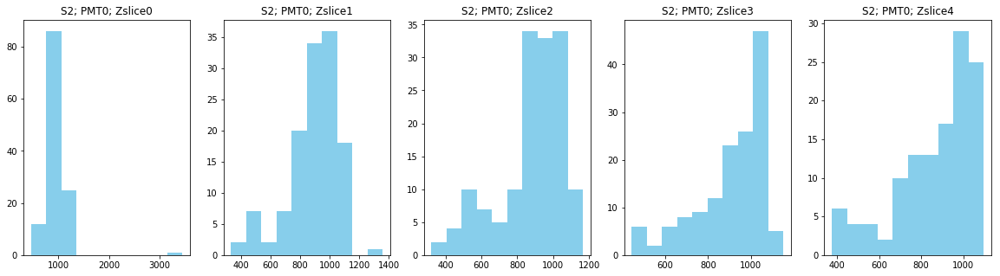

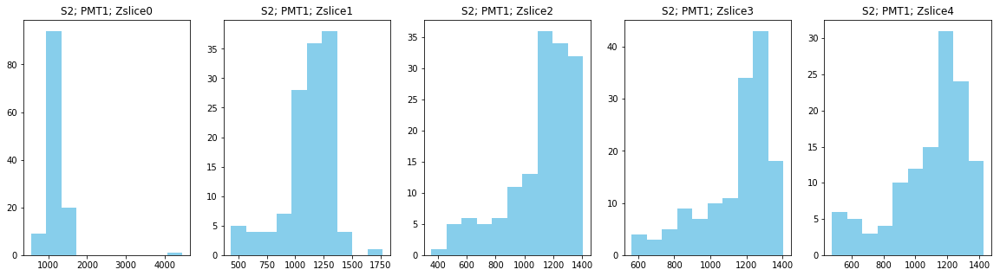

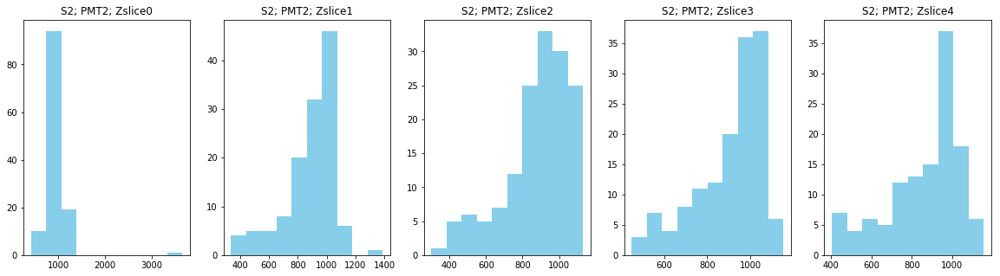

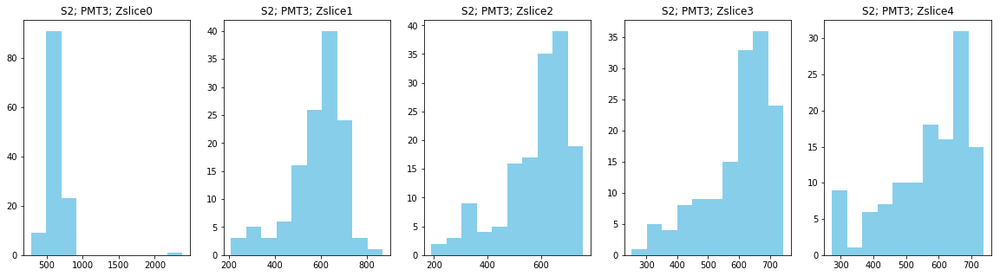

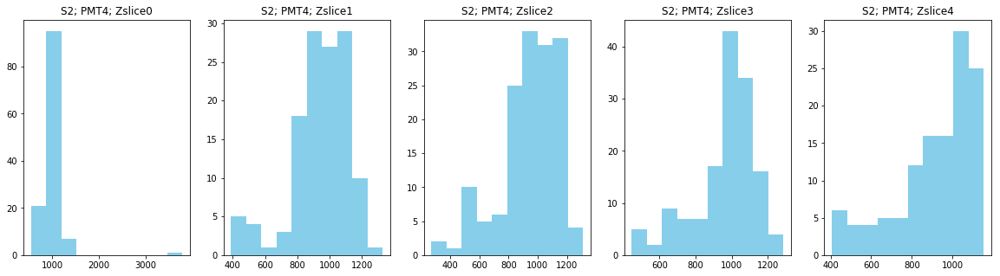

...

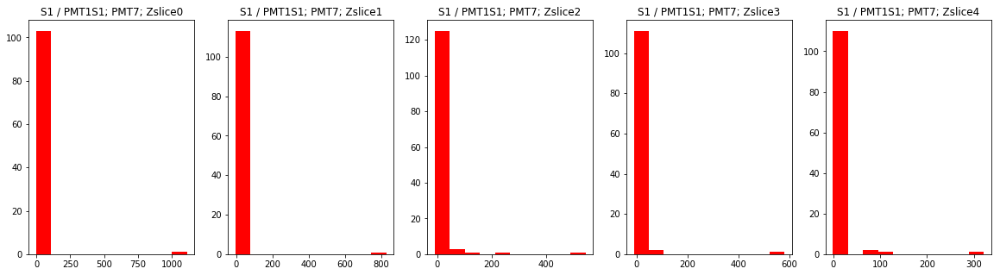

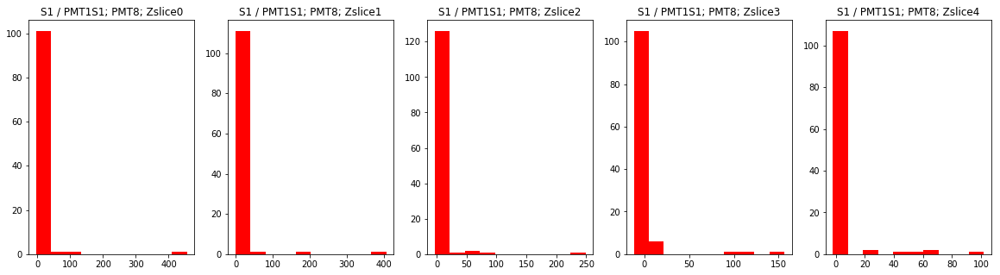

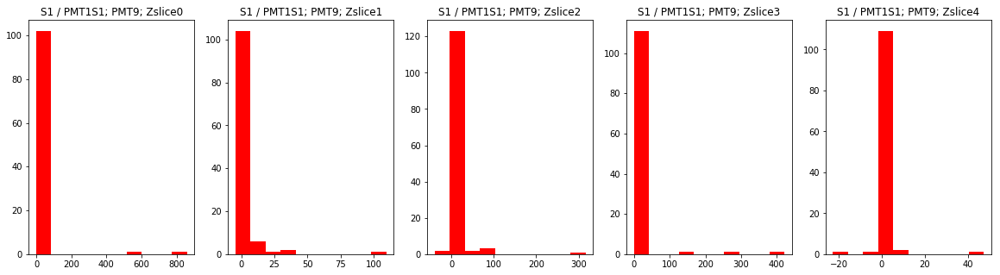

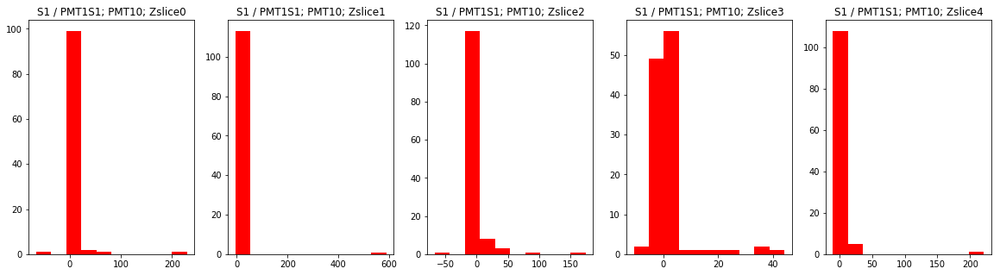

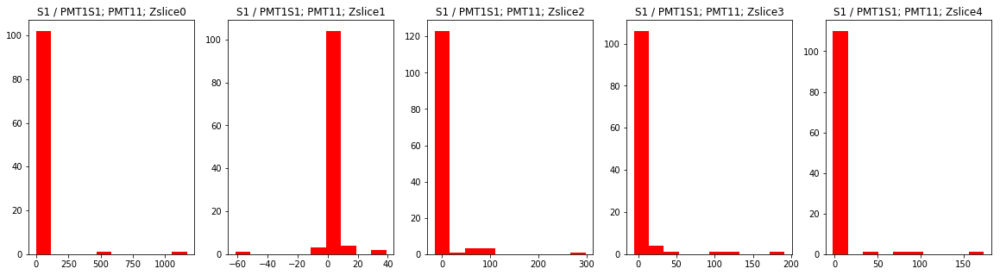

Calculated S2 matrix =
[[0.7953721, 0.79432756, 0.79626554, 0.79416263, 0.7961186], [1.0, 1.0, 1.0, 1.0, 1.0], [0.7967564, 0.79529244, 0.7957811, 0.7936037, 0.7930631], [0.52920276, 0.52452326, 0.52730566, 0.522914, 0.5245474], [0.8440625, 0.8469191, 0.85375667, 0.84290326, 0.8420862], [0.7018679, 0.69609916, 0.69952065, 0.6979804, 0.6990637], [0.63043296, 0.63018167, 0.6298181, 0.63061184, 0.62953526], [0.6248777, 0.6242208, 0.6252883, 0.6205749, 0.62433434], [0.73317254, 0.7260917, 0.7296817, 0.7275038, 0.72458965], [0.6270066, 0.6192615, 0.62882394, 0.62515354, 0.6262691], [0.71896356, 0.71477354, 0.7200799, 0.72135705, 0.71954346], [0.60317373, 0.5973234, 0.59874487, 0.59463173, 0.60001487]]
calculating mc...


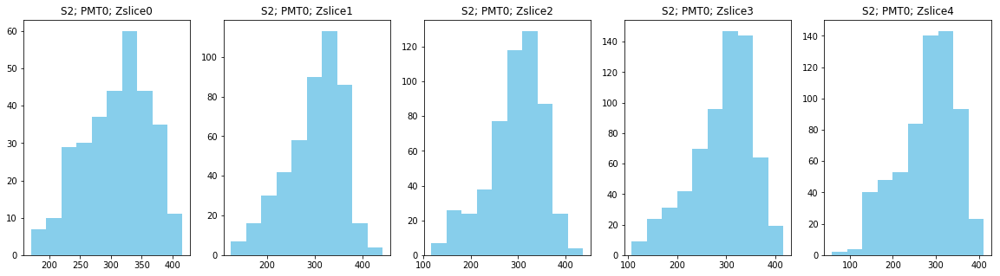

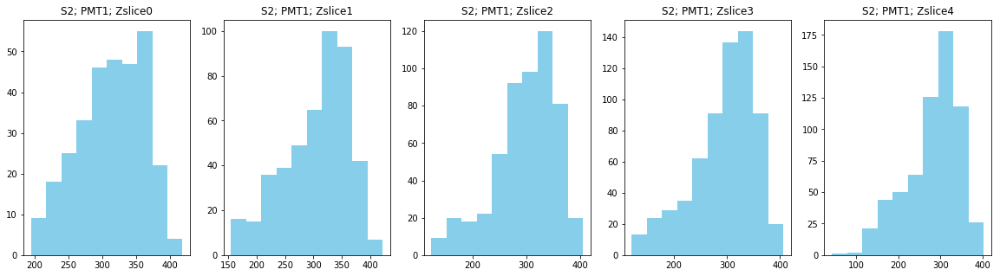

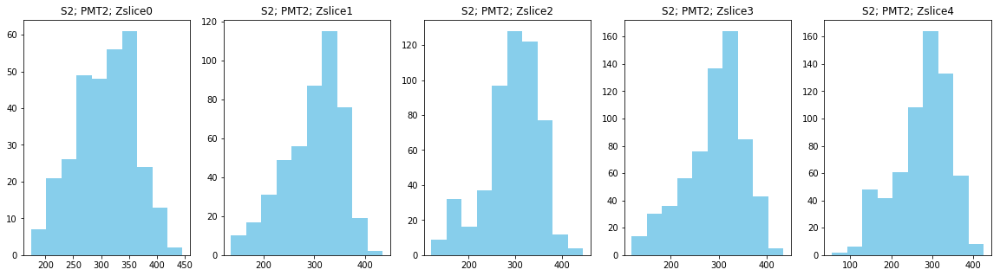

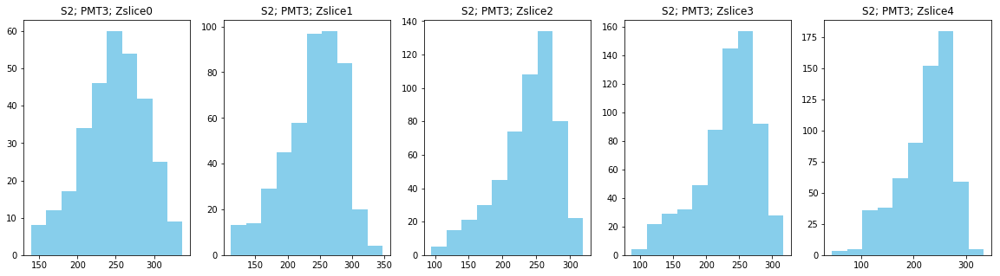

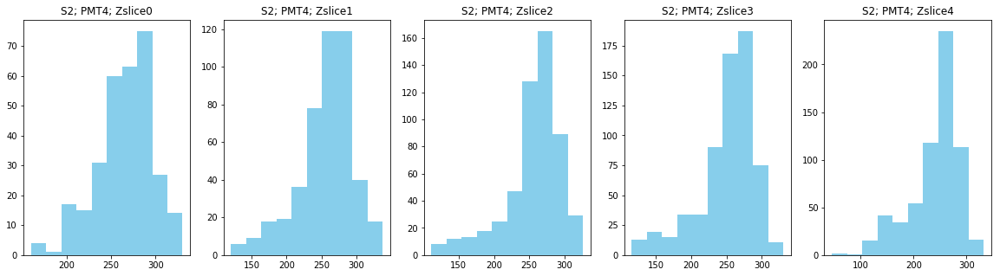

...

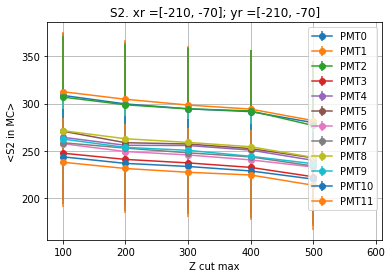

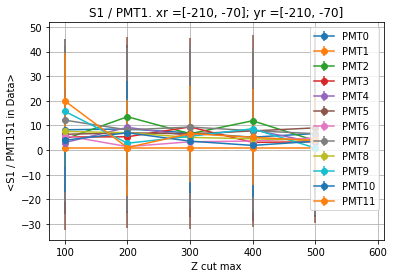

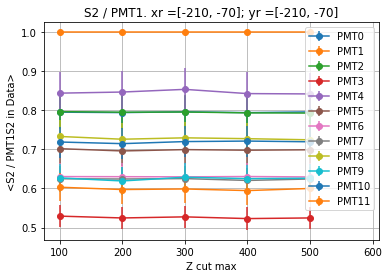

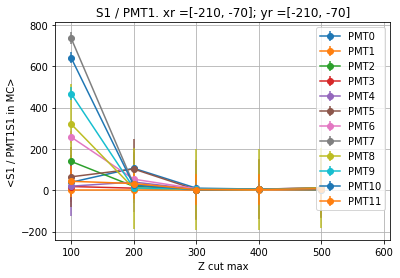

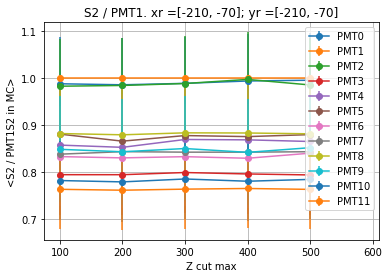

Dividing S2s
Dividing S1s


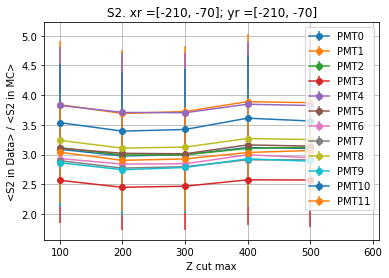

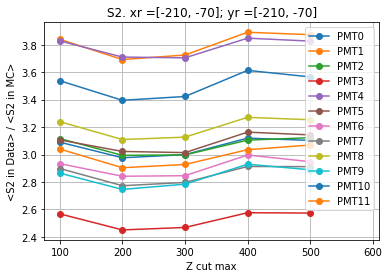

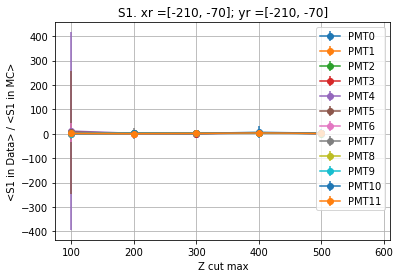

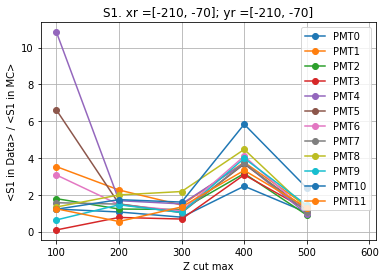

xr = [-210, -70] ; yr = [-70, 70]
calculating data...


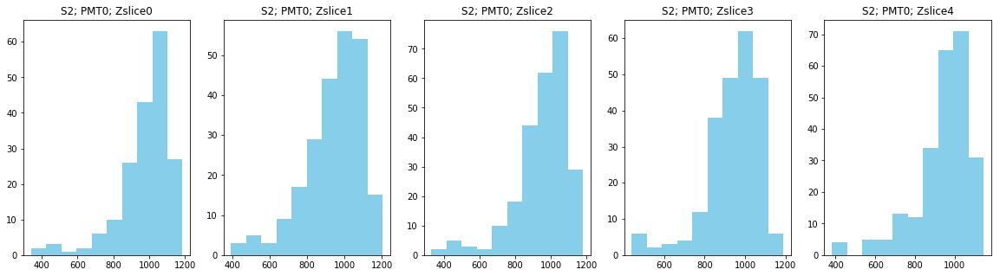

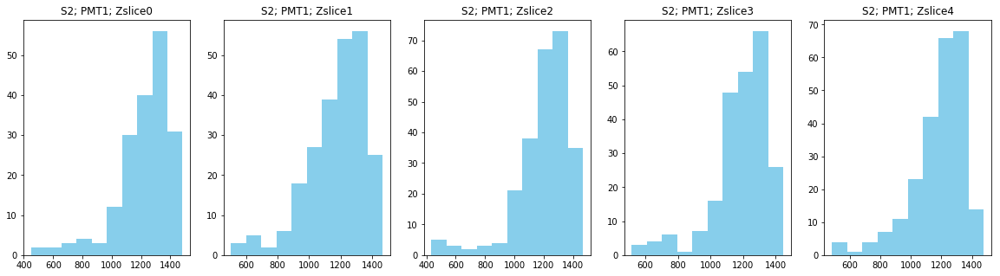

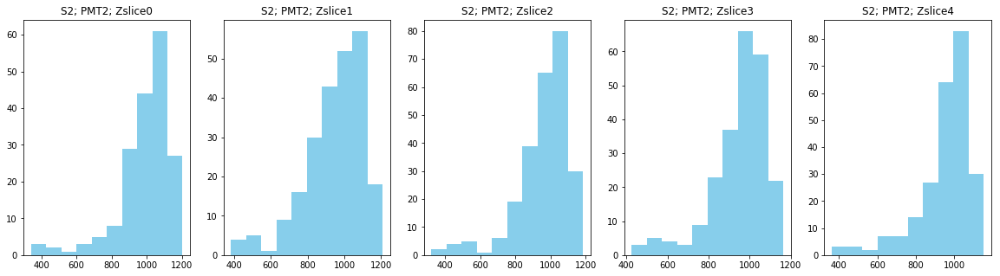

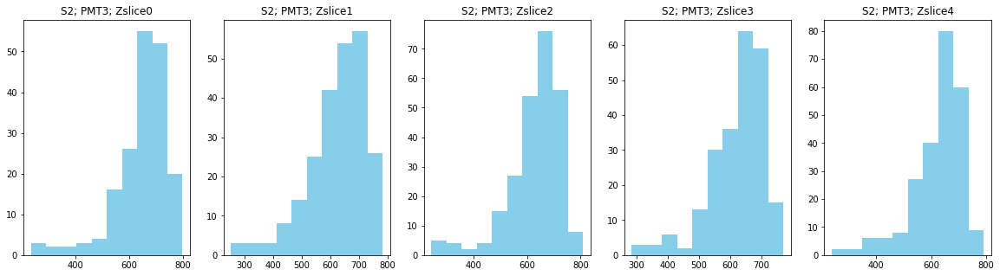

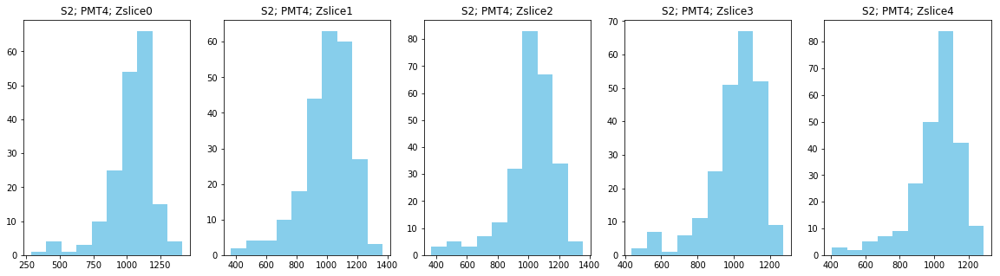

...

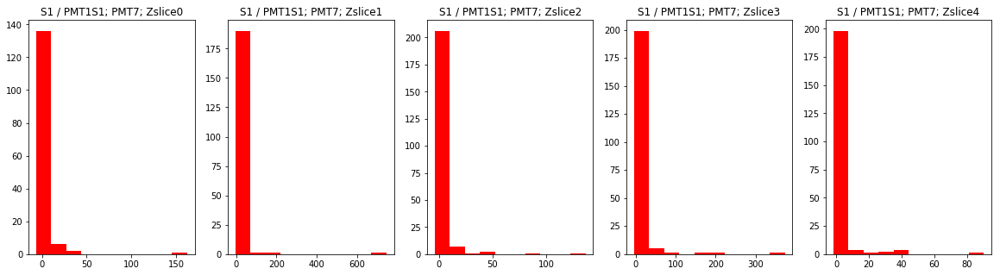

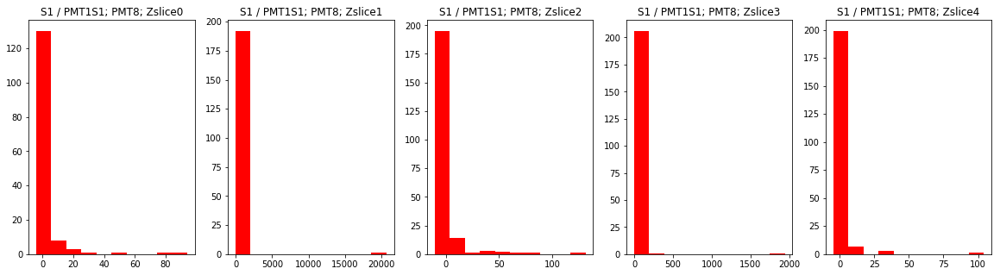

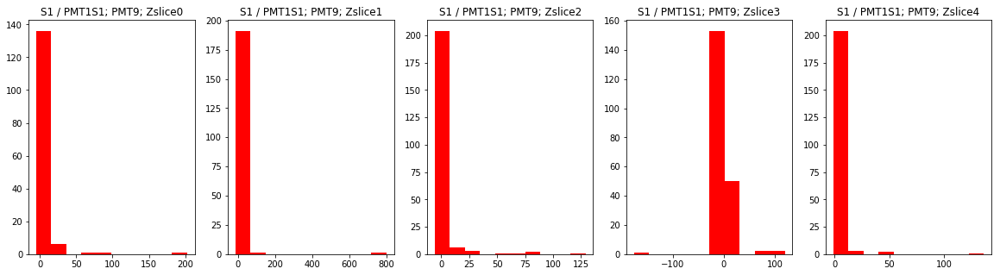

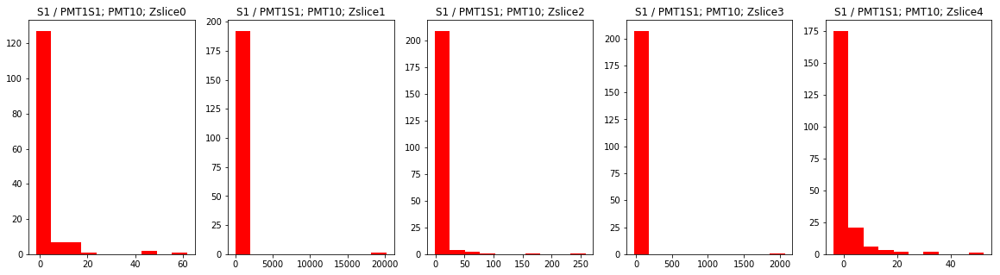

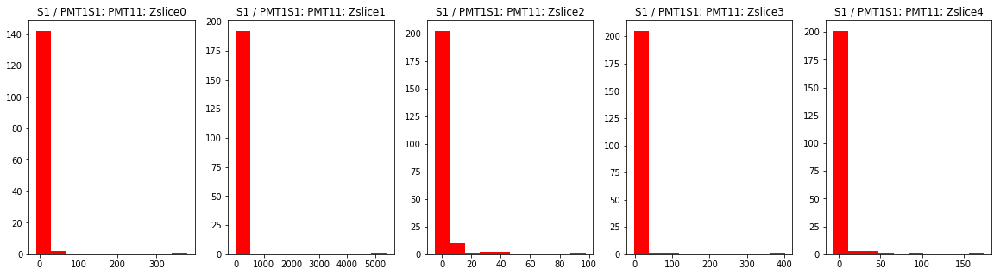

Calculated S2 matrix =
[[0.79650414, 0.8004287, 0.79427636, 0.7928166, 0.79540443], [1.0, 1.0, 1.0, 1.0, 1.0], [0.80808836, 0.80372304, 0.80254865, 0.7997545, 0.80337113], [0.52959746, 0.5322841, 0.52562416, 0.52517253, 0.52771103], [0.8438764, 0.85297644, 0.84826666, 0.84807485, 0.8542555], [0.7021016, 0.7009728, 0.69721556, 0.69628763, 0.6962324], [0.62777877, 0.6253892, 0.6289093, 0.62303555, 0.62708336], [0.62555975, 0.6231057, 0.6184317, 0.6211536, 0.62374634], [0.72676486, 0.7281931, 0.7244984, 0.7219534, 0.72663784], [0.6205973, 0.619814, 0.6188121, 0.61877096, 0.6207395], [0.72236073, 0.7227092, 0.7226282, 0.7216683, 0.7190661], [0.59875107, 0.6042371, 0.6003881, 0.5982822, 0.5985021]]
calculating mc...


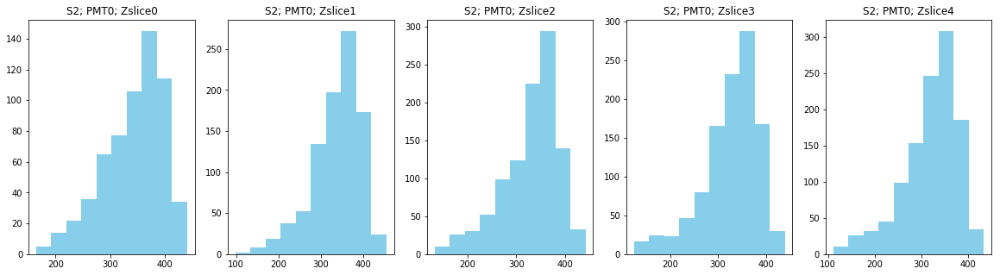

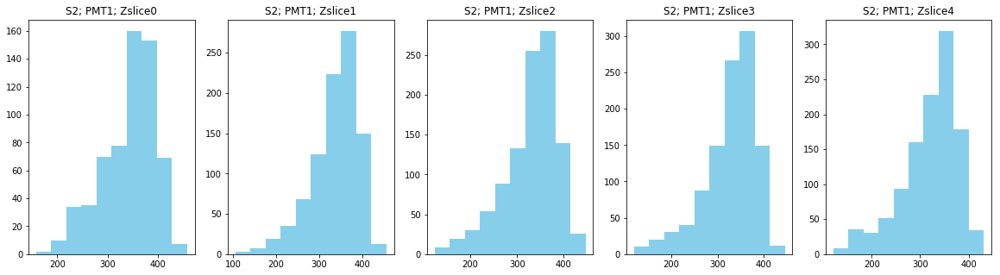

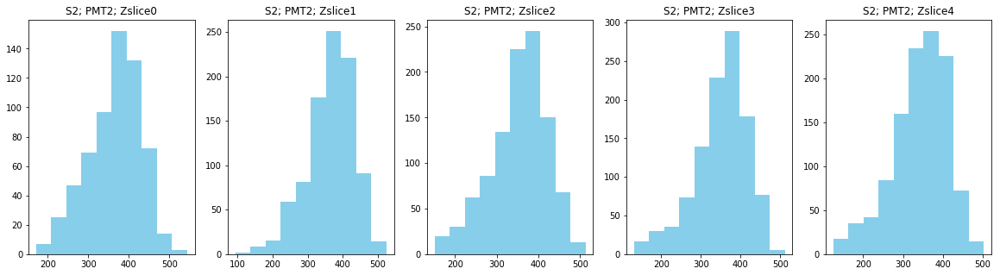

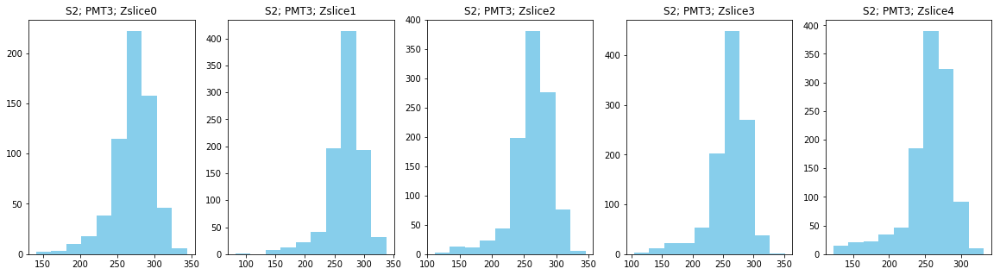

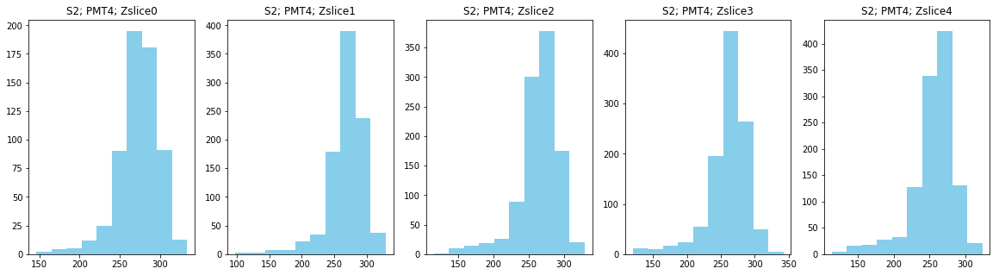

...

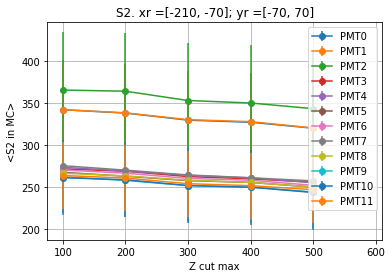

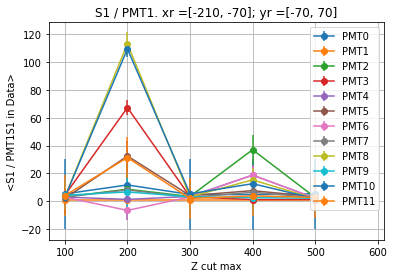

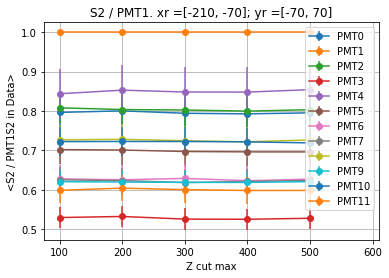

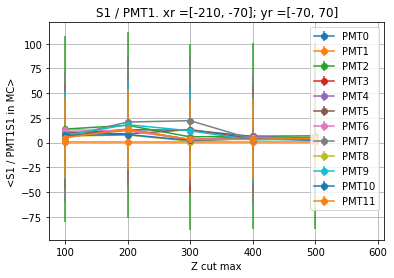

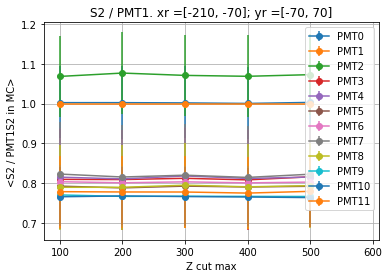

Dividing S2s
Dividing S1s


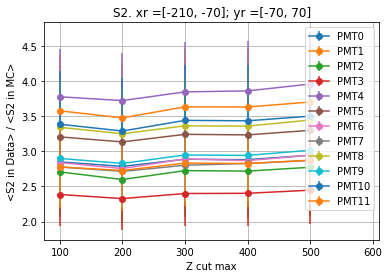

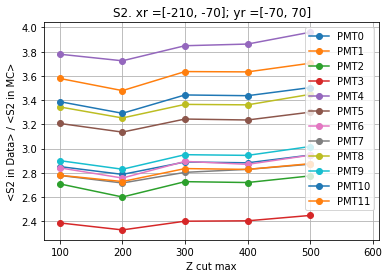

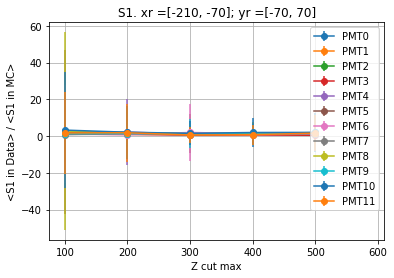

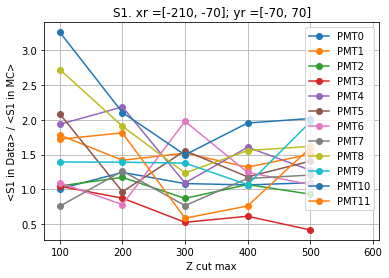

xr = [-210, -70] ; yr = [70, 210]
calculating data...


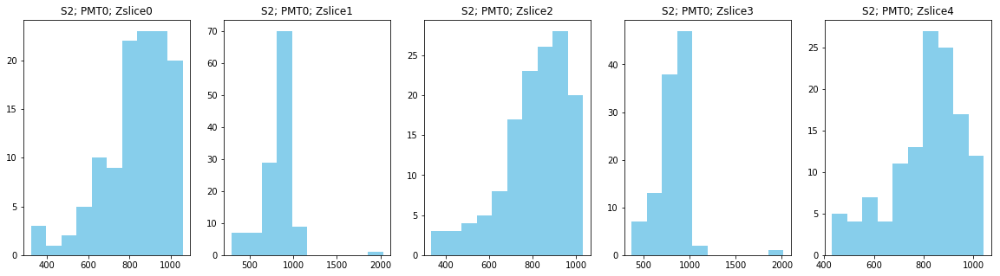

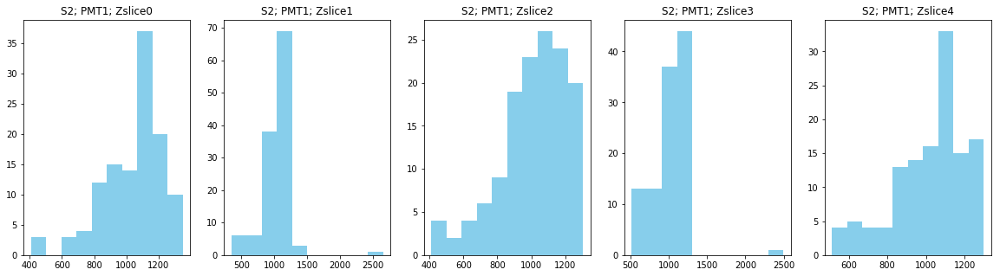

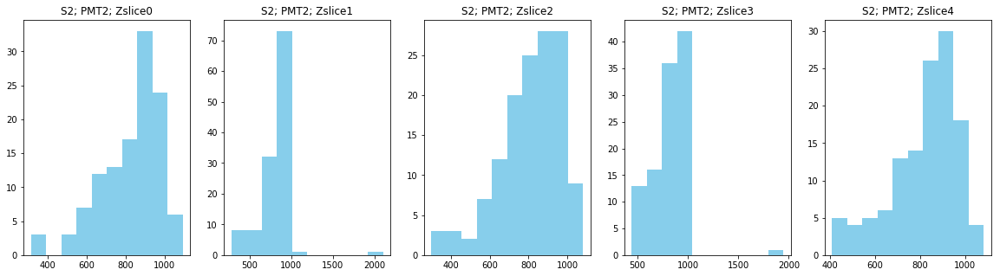

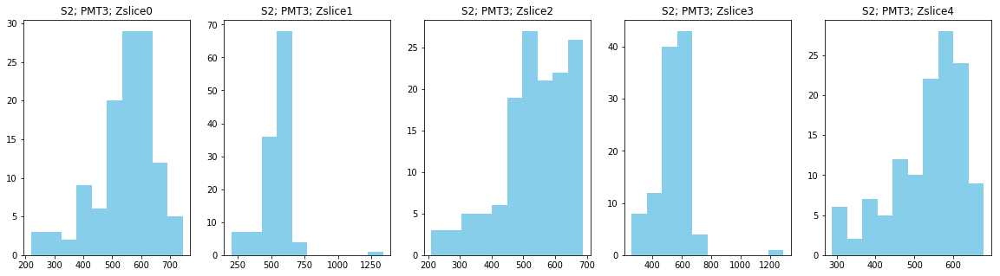

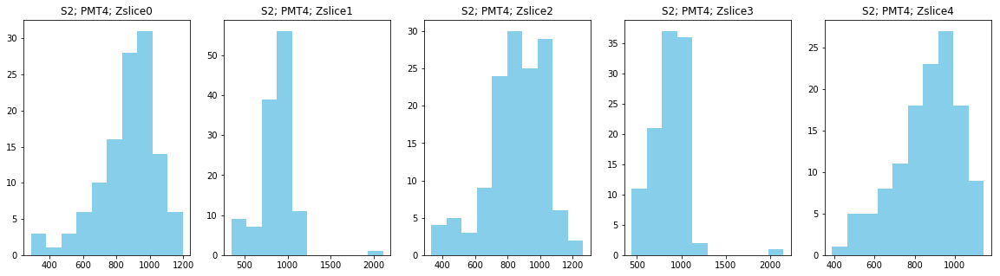

...

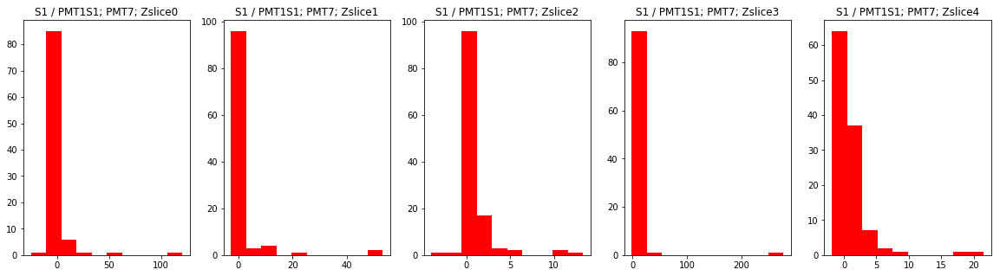

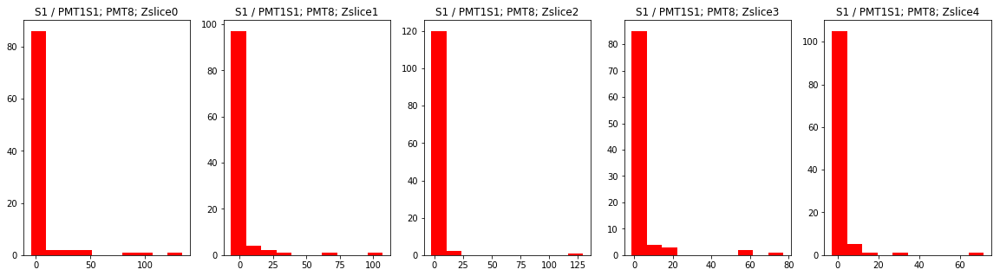

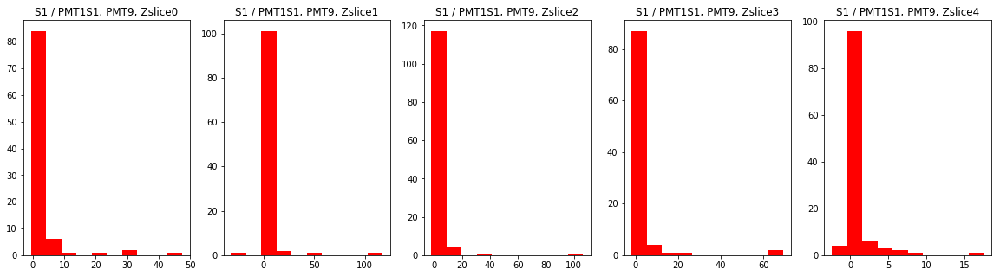

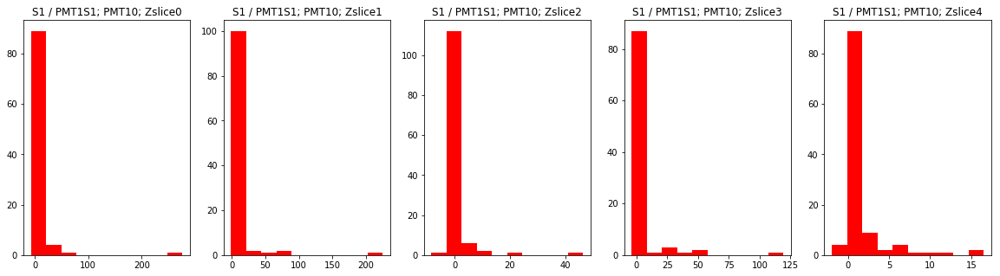

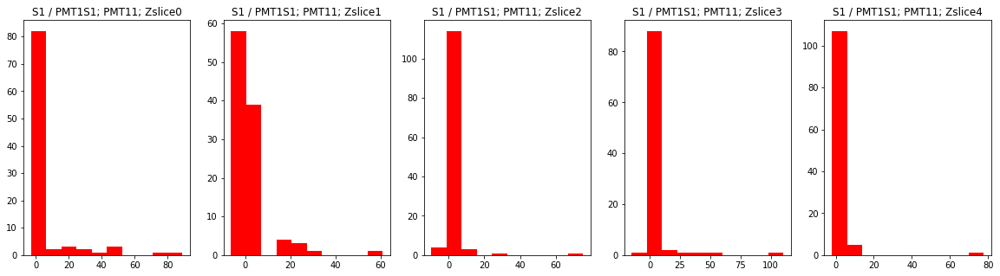

Calculated S2 matrix =
[[0.79980236, 0.8097101, 0.802258, 0.79970324, 0.7982334], [1.0, 1.0, 1.0, 1.0, 1.0], [0.7956057, 0.8051706, 0.8010148, 0.8019077, 0.80281544], [0.5255191, 0.53122646, 0.528979, 0.52872044, 0.5263892], [0.836385, 0.8547985, 0.8445781, 0.85285735, 0.84857726], [0.7020399, 0.705276, 0.70548457, 0.7007519, 0.7026555], [0.6243829, 0.62985224, 0.6260758, 0.63085085, 0.62531674], [0.6127649, 0.621099, 0.6154246, 0.6168704, 0.6188068], [0.7236678, 0.72808284, 0.7191633, 0.7212831, 0.72411925], [0.6173976, 0.62351495, 0.6202836, 0.6225475, 0.62524617], [0.7192491, 0.7303864, 0.727525, 0.7304784, 0.72779715], [0.6047463, 0.61216176, 0.6033099, 0.6120156, 0.60276425]]
calculating mc...


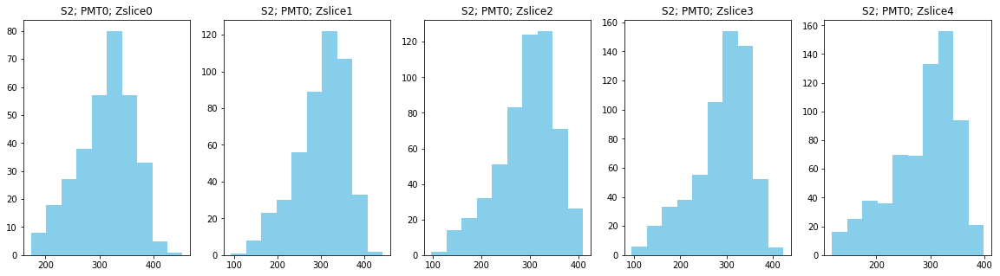

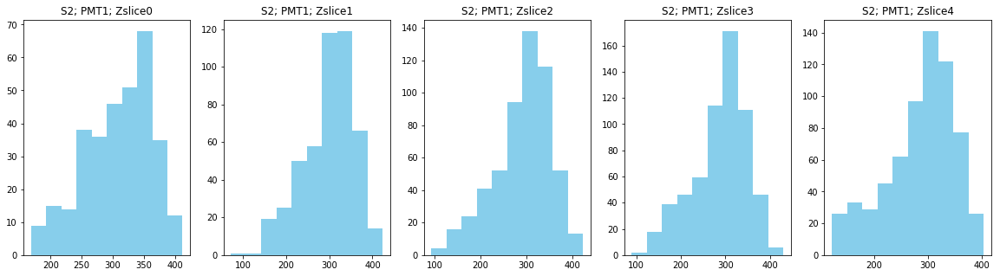

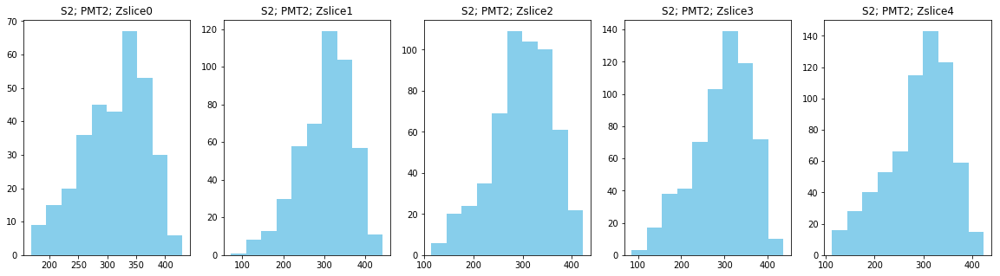

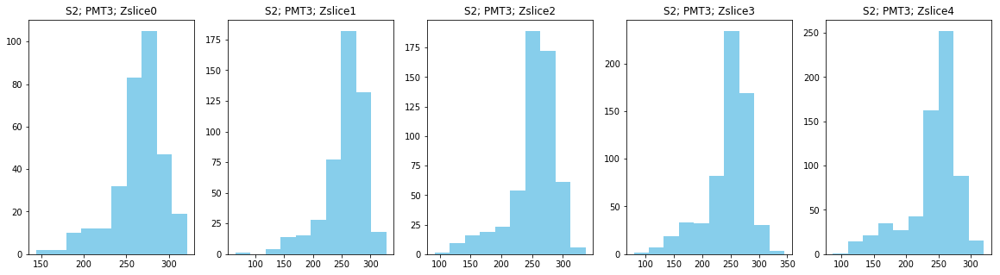

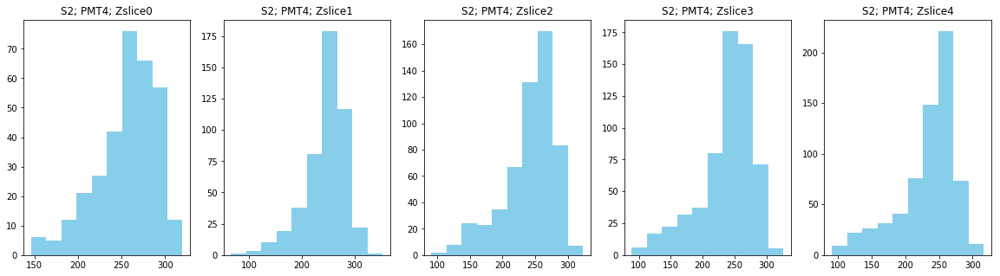

...

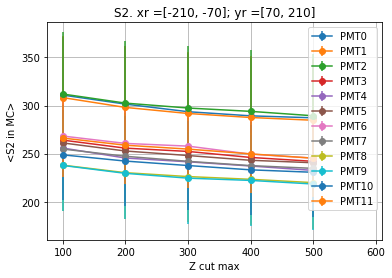

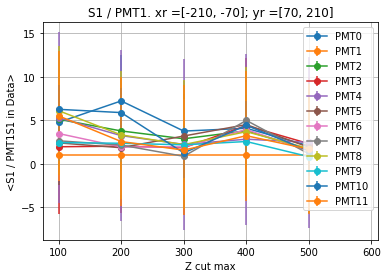

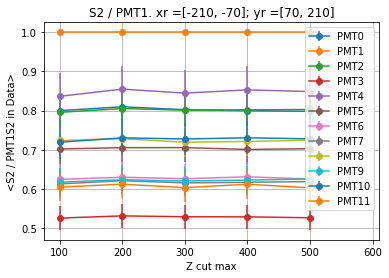

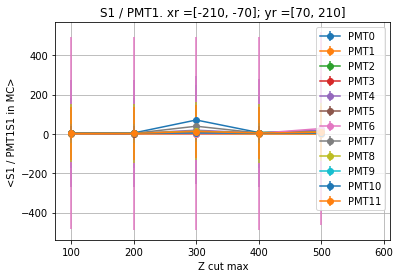

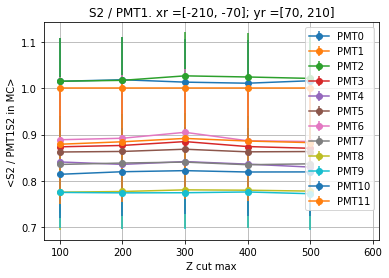

Dividing S2s
Dividing S1s


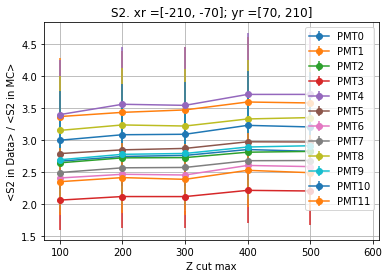

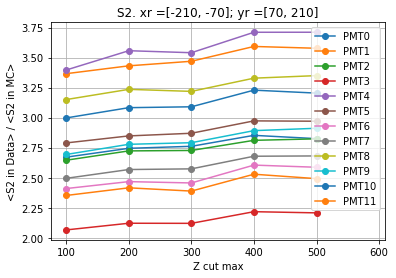

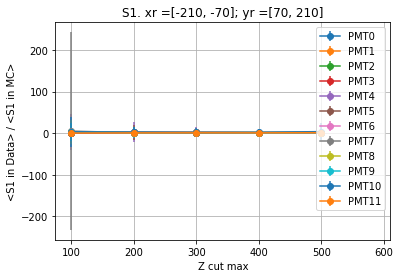

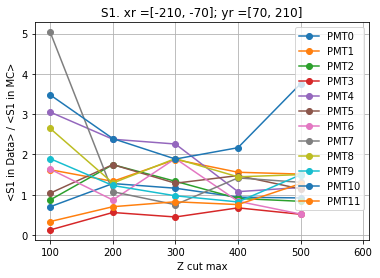

xr = [-70, 70] ; yr = [-210, -70]
calculating data...


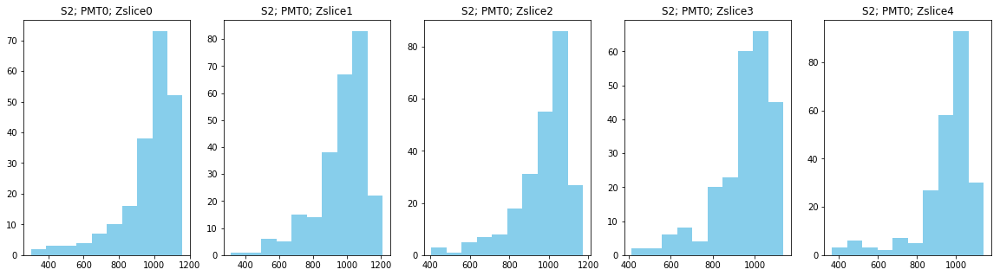

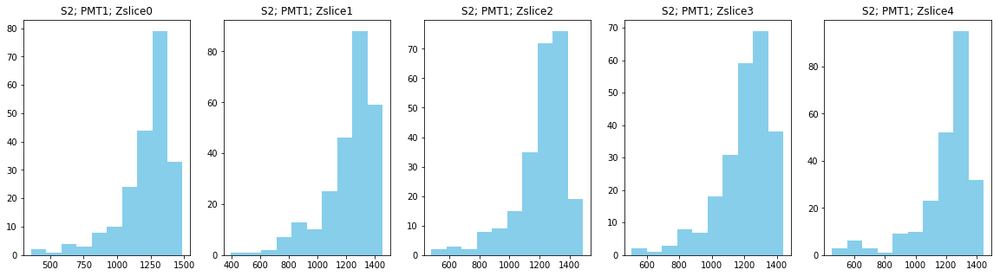

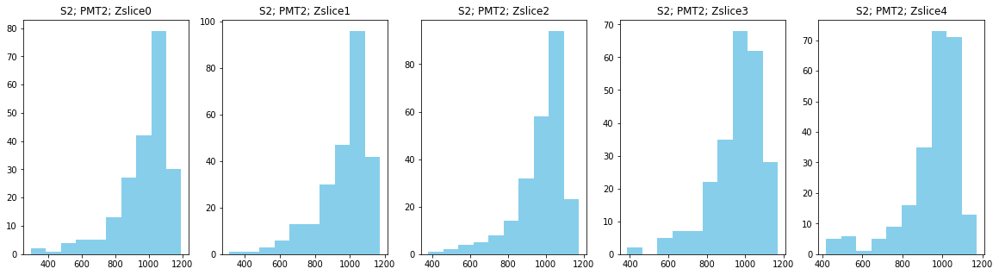

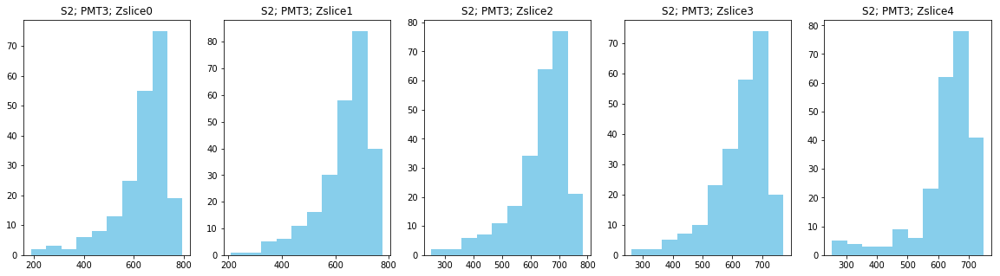

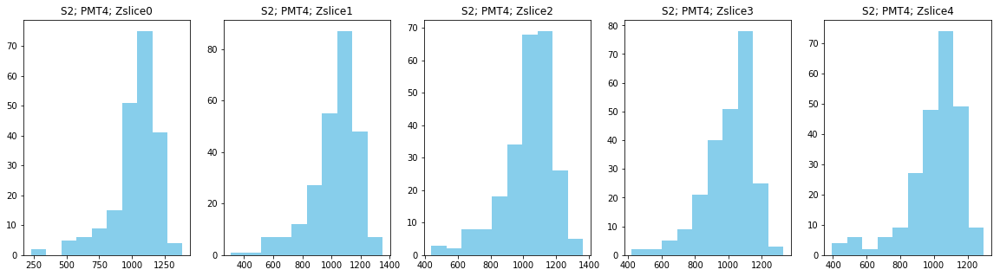

...

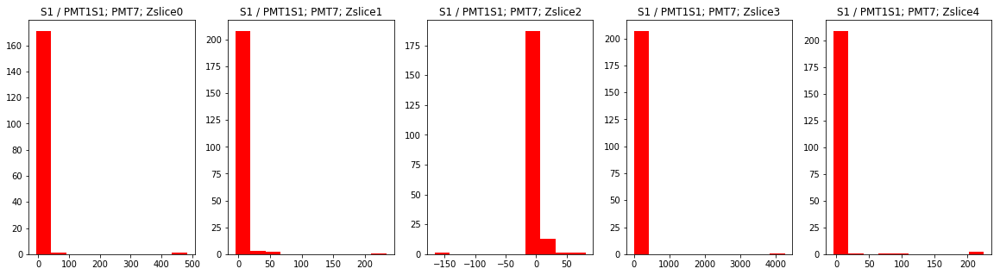

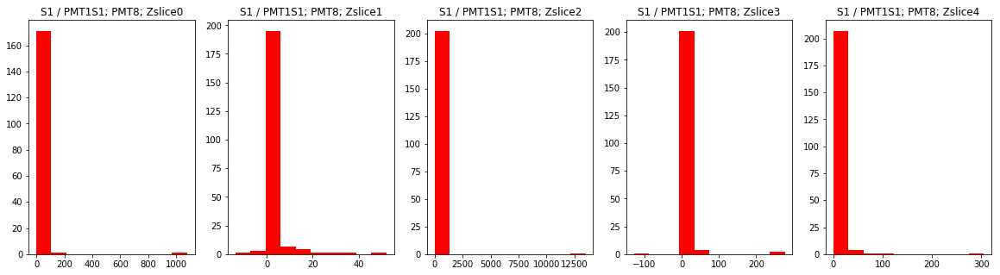

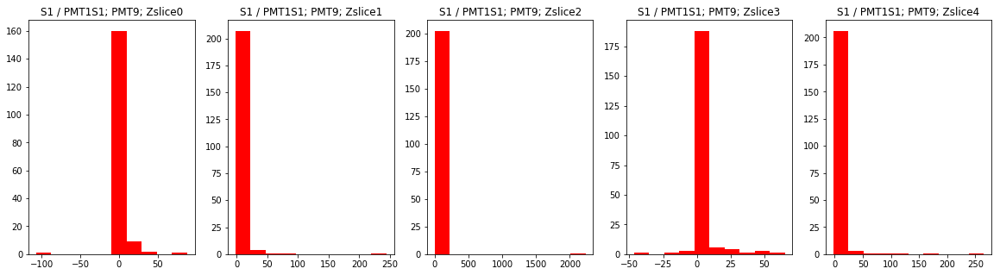

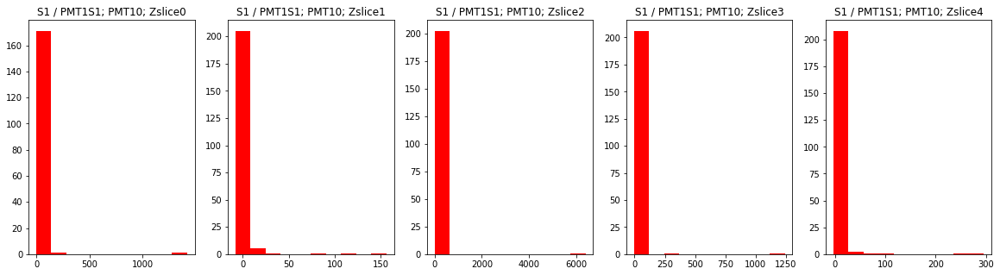

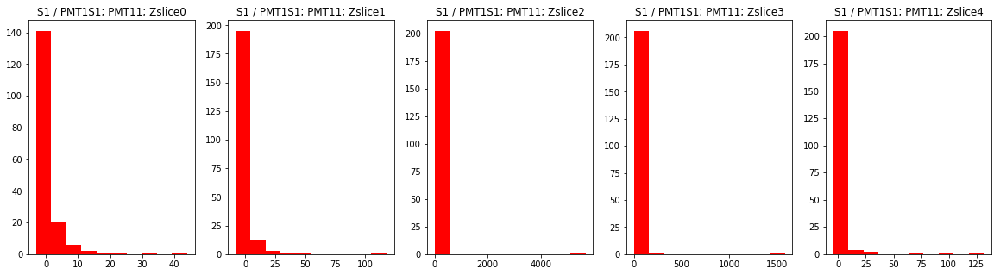

Calculated S2 matrix =
[[0.7944354, 0.7984422, 0.796583, 0.7939798, 0.7891453], [1.0, 1.0, 1.0, 1.0, 1.0], [0.8001244, 0.7962568, 0.7989165, 0.79763424, 0.79460835], [0.5211907, 0.52291197, 0.5229702, 0.52182096, 0.52107775], [0.84160054, 0.8419646, 0.8484165, 0.8367582, 0.8367529], [0.6945094, 0.6944646, 0.69316095, 0.69337153, 0.68721676], [0.6215038, 0.6273432, 0.62058926, 0.62076336, 0.62018853], [0.62182456, 0.6235712, 0.6182647, 0.61881, 0.6190438], [0.72742534, 0.7247596, 0.7287804, 0.7256334, 0.72373104], [0.62693477, 0.6308163, 0.6280485, 0.62256753, 0.6244043], [0.7224877, 0.7304573, 0.7243099, 0.7226862, 0.72380877], [0.60015625, 0.5999264, 0.59898895, 0.5997819, 0.5965225]]
calculating mc...


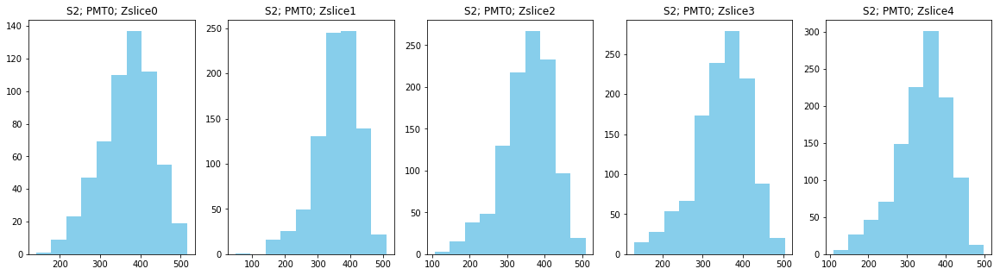

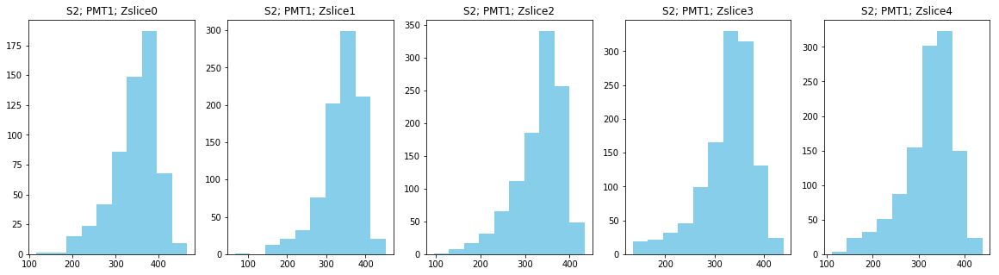

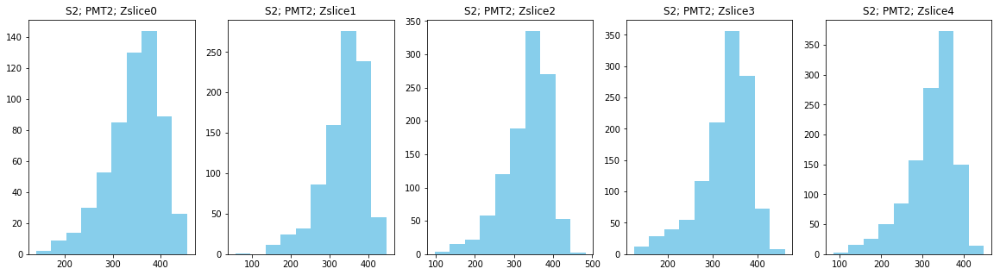

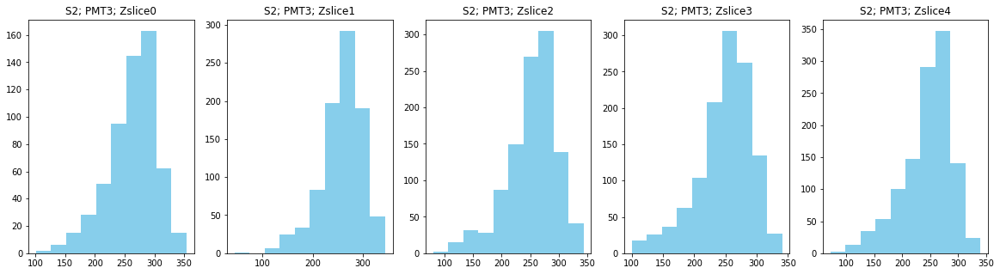

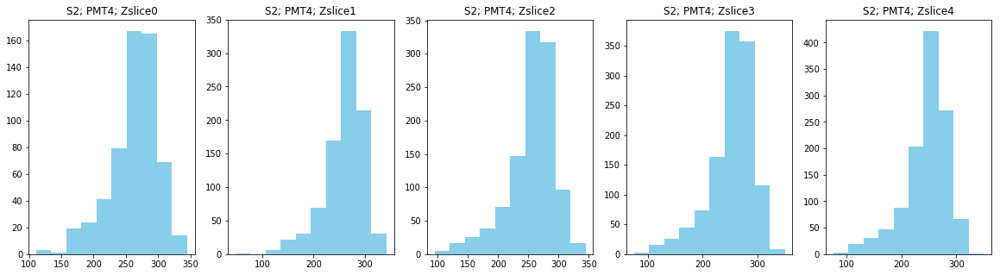

...

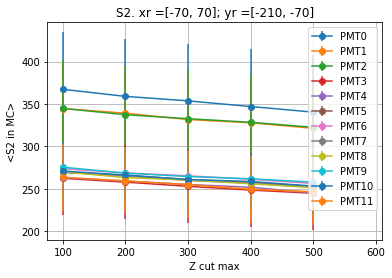

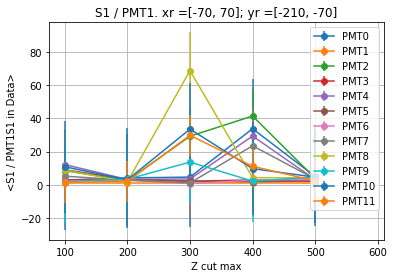

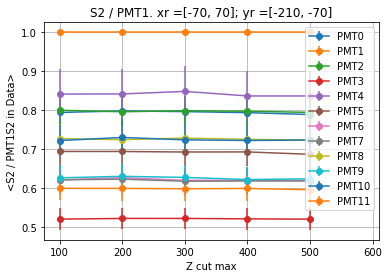

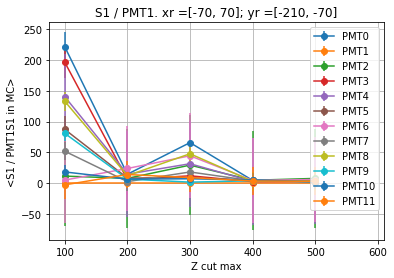

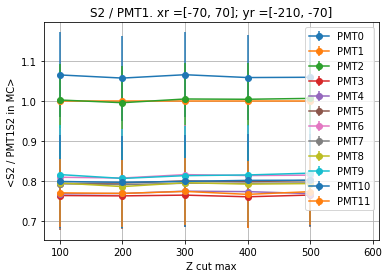

Dividing S2s
Dividing S1s


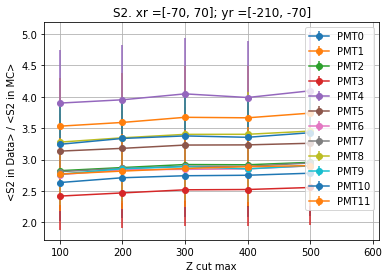

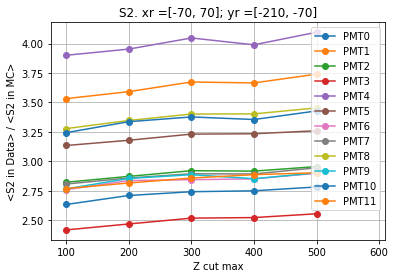

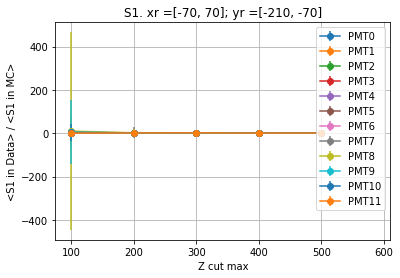

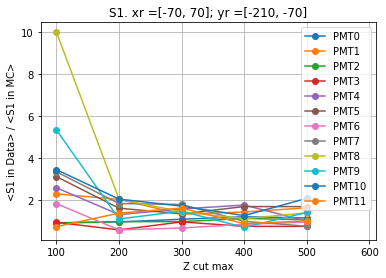

xr = [-70, 70] ; yr = [-70, 70]
calculating data...


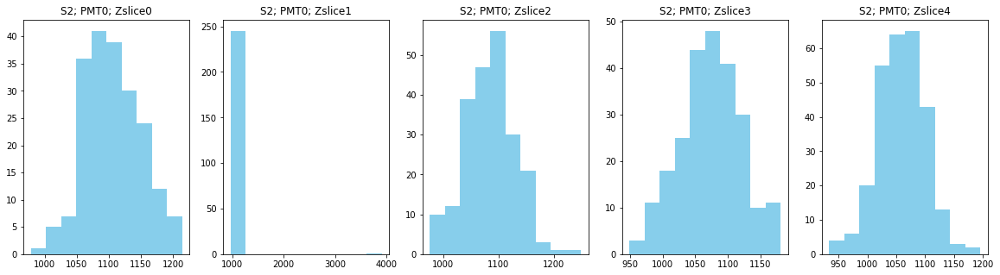

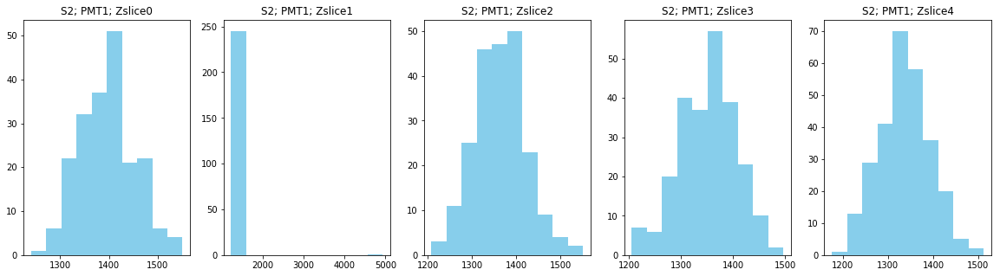

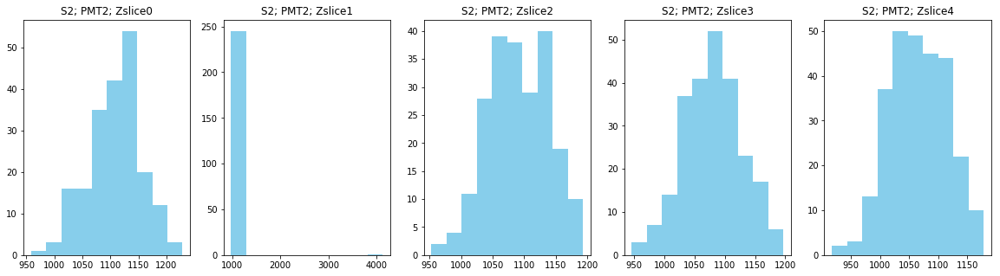

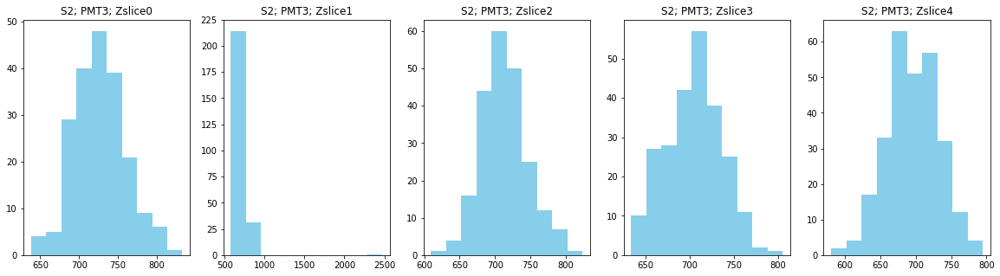

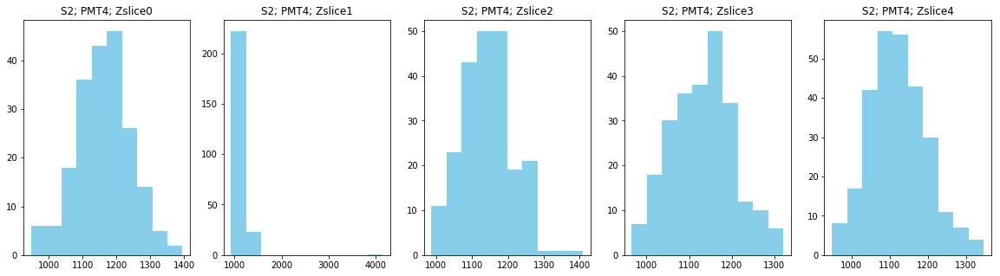

...

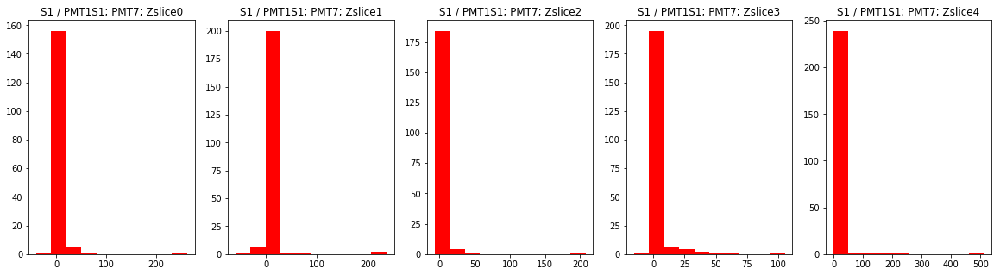

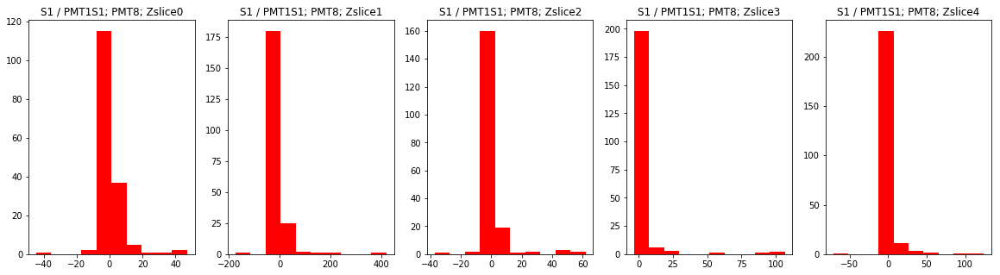

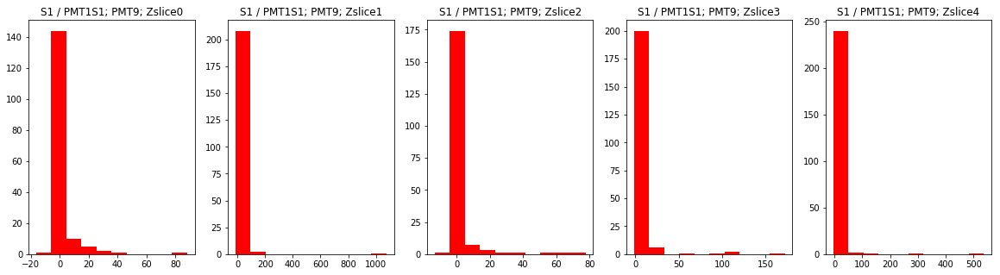

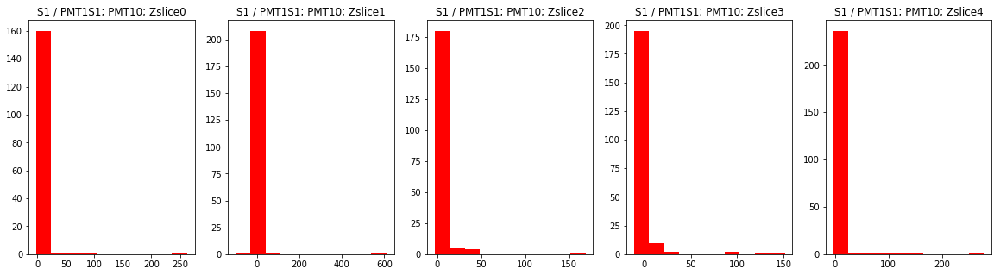

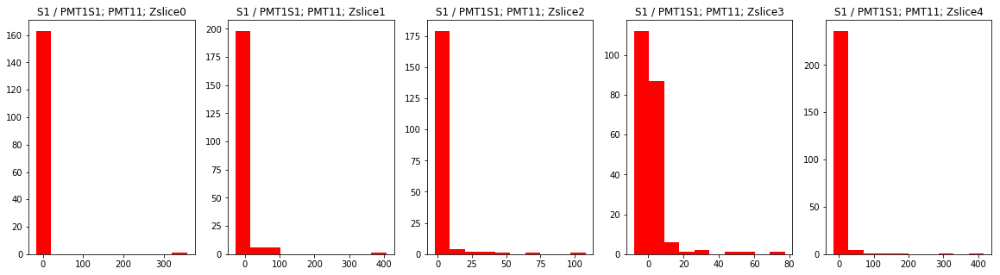

Calculated S2 matrix =
[[0.793454, 0.79341835, 0.796826, 0.7947092, 0.7931524], [1.0, 1.0, 1.0, 1.0, 1.0], [0.79563767, 0.793981, 0.8008964, 0.79909843, 0.7982179], [0.5215093, 0.51958734, 0.5238723, 0.5219213, 0.52045035], [0.83255506, 0.83217055, 0.83886355, 0.83774924, 0.83990425], [0.68757904, 0.68720657, 0.6894215, 0.6897858, 0.68689245], [0.611965, 0.61466366, 0.6173661, 0.6149731, 0.6173584], [0.6113618, 0.61157846, 0.61295897, 0.61598986, 0.6143792], [0.71689487, 0.7193091, 0.72387874, 0.71964794, 0.719697], [0.6199174, 0.61761314, 0.61978775, 0.62055343, 0.61940795], [0.7191485, 0.7197555, 0.7205722, 0.7213137, 0.7186428], [0.59506565, 0.5933417, 0.5956428, 0.59685045, 0.5973996]]
calculating mc...


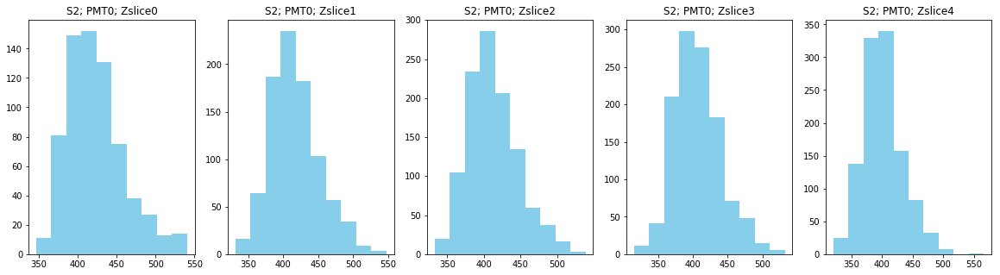

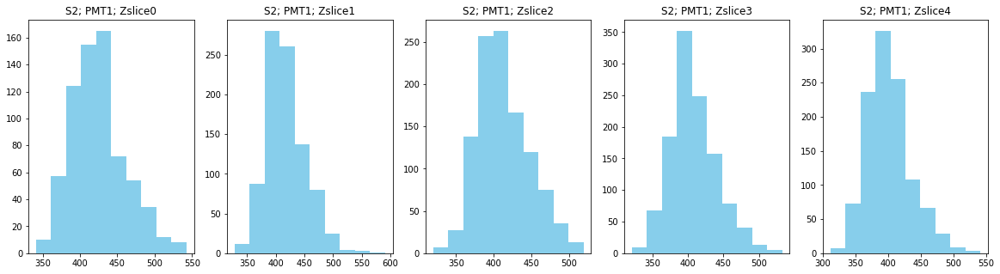

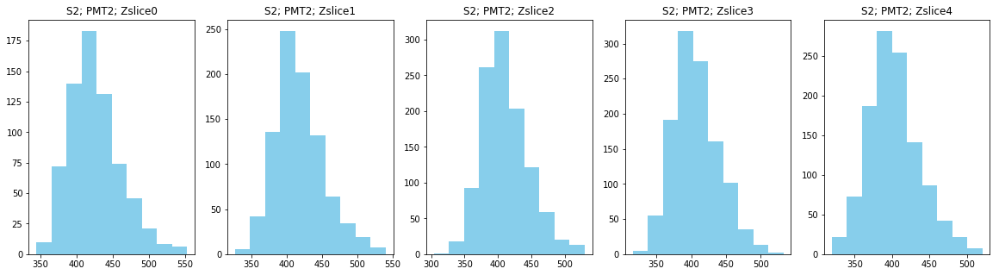

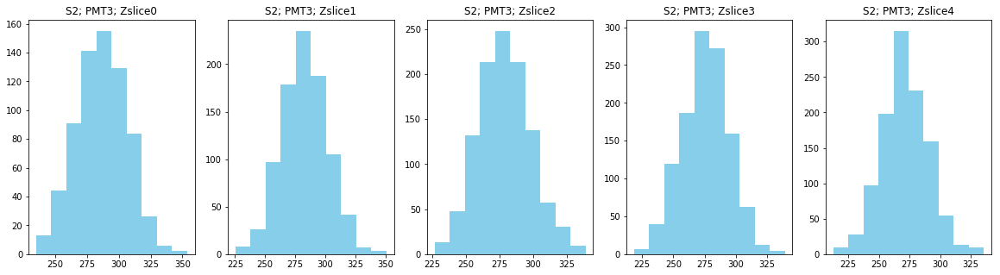

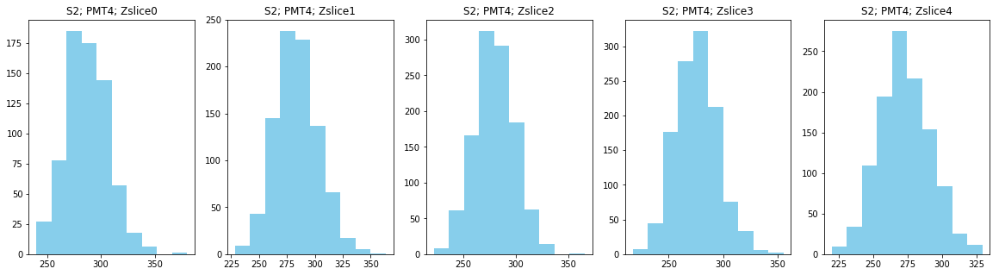

...

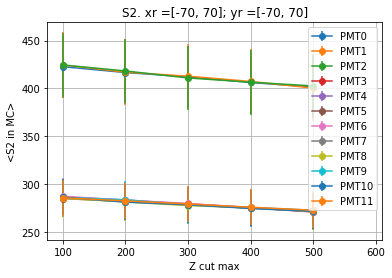

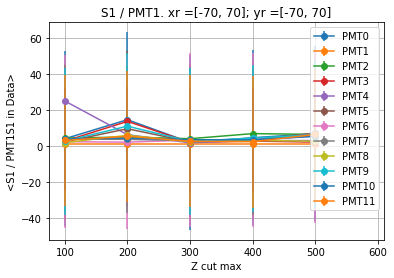

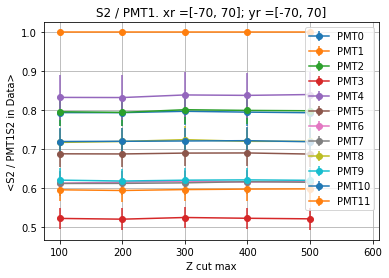

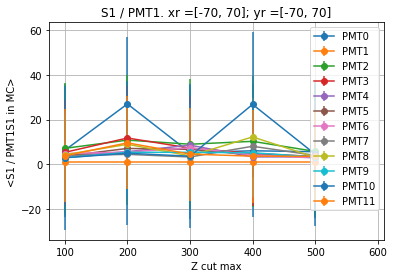

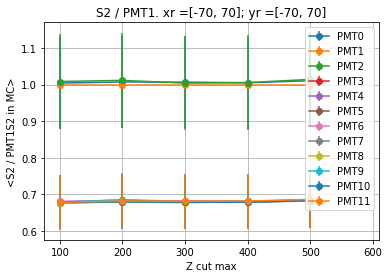

Dividing S2s
Dividing S1s


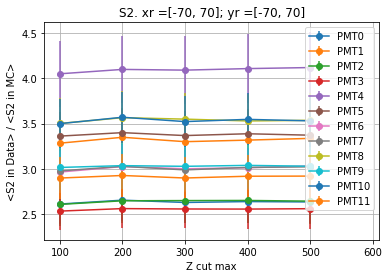

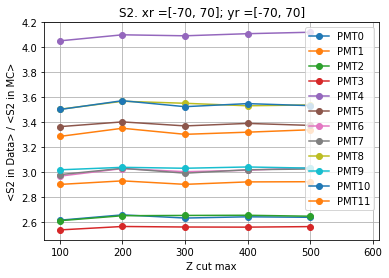

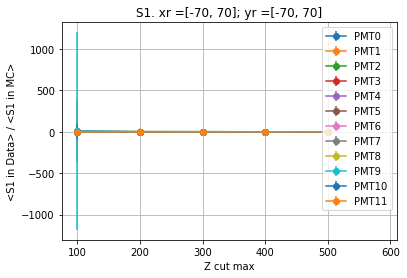

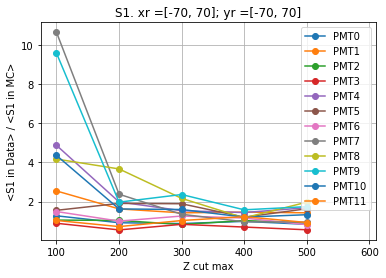

xr = [-70, 70] ; yr = [70, 210]
calculating data...


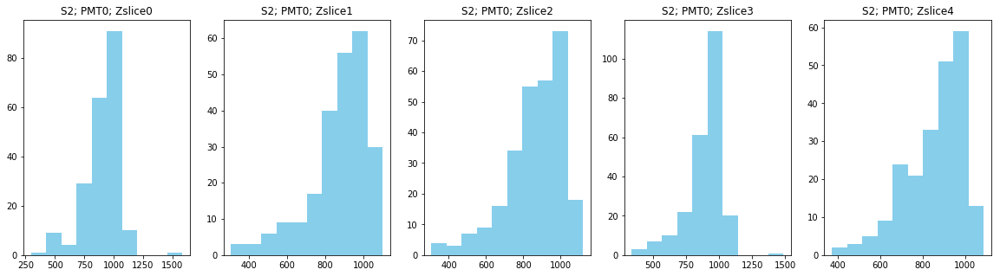

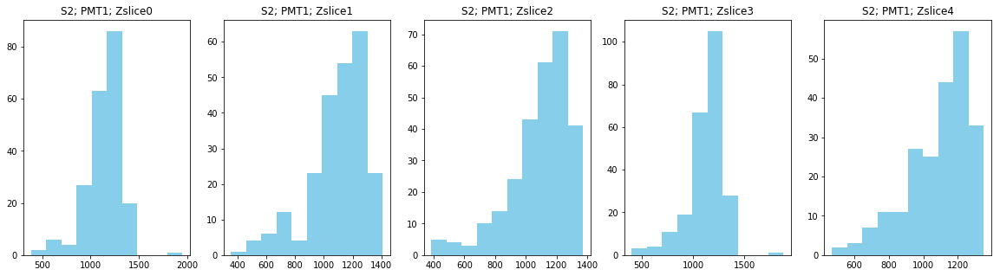

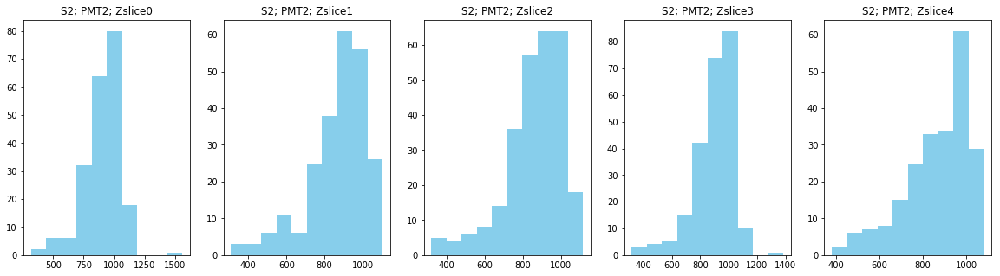

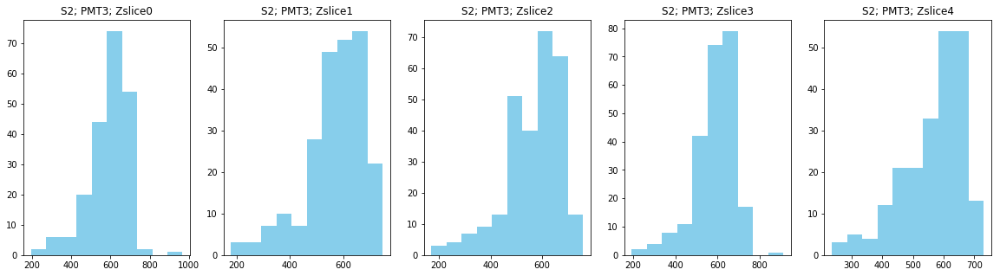

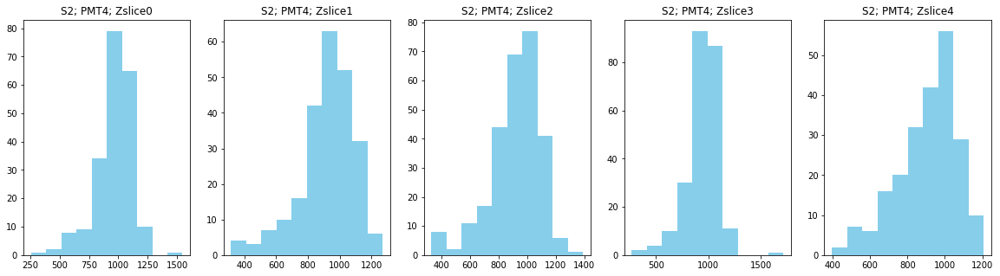

...

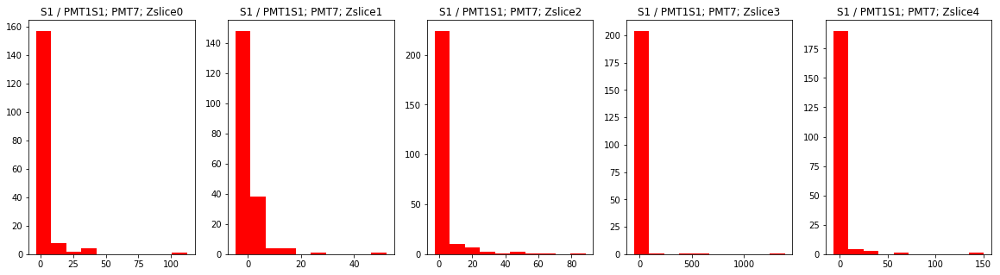

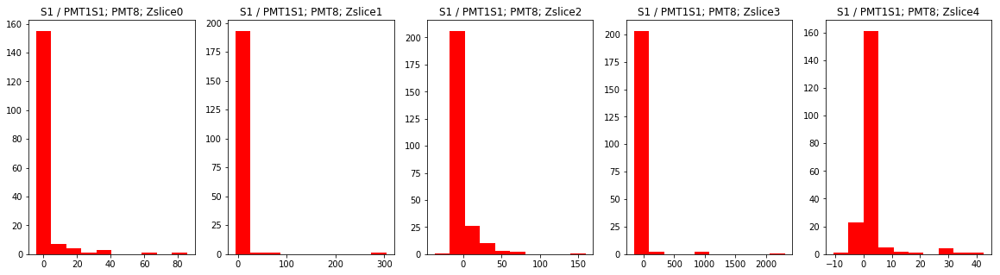

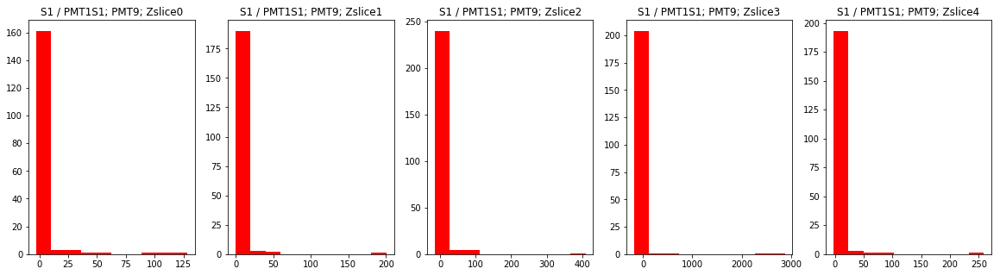

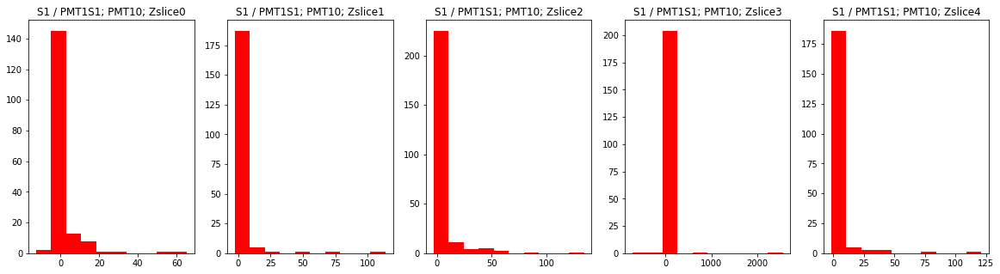

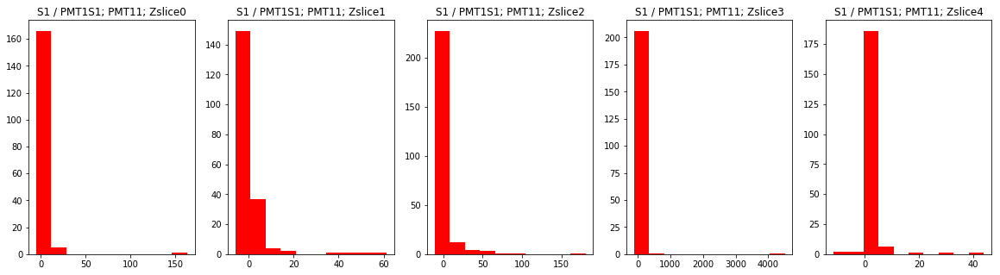

Calculated S2 matrix =
[[0.7920272, 0.79357105, 0.792568, 0.7927991, 0.7888196], [1.0, 1.0, 1.0, 1.0, 1.0], [0.7955823, 0.7913895, 0.78952223, 0.7930889, 0.7915733], [0.5163369, 0.5185073, 0.5196864, 0.5201258, 0.51819736], [0.8443329, 0.83614, 0.84466475, 0.8375663, 0.83530885], [0.68692476, 0.69004816, 0.6880687, 0.69053197, 0.6857932], [0.6146389, 0.6173108, 0.6141348, 0.61444694, 0.61619735], [0.6112421, 0.6130016, 0.61075497, 0.6091648, 0.6079738], [0.7180646, 0.71974975, 0.71523863, 0.7203104, 0.7184813], [0.61896825, 0.61791307, 0.6182622, 0.61680716, 0.6184588], [0.7223692, 0.722336, 0.7232047, 0.7229601, 0.7195439], [0.6002901, 0.60154074, 0.6005399, 0.59839636, 0.5990677]]
calculating mc...


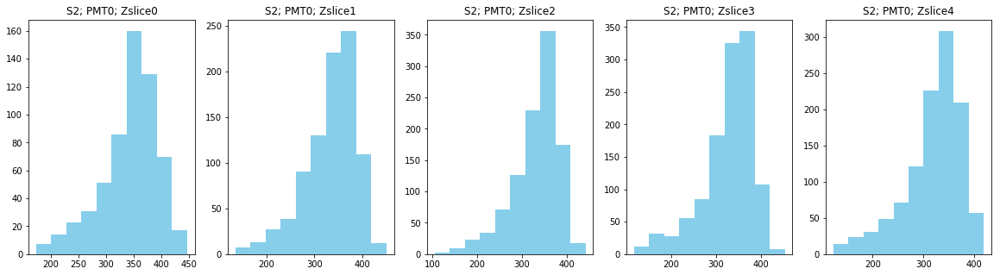

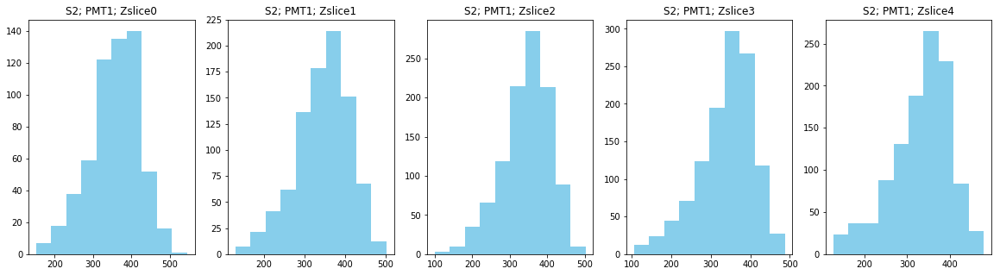

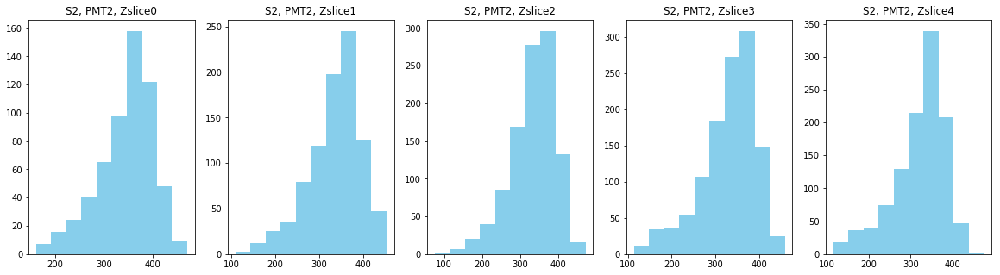

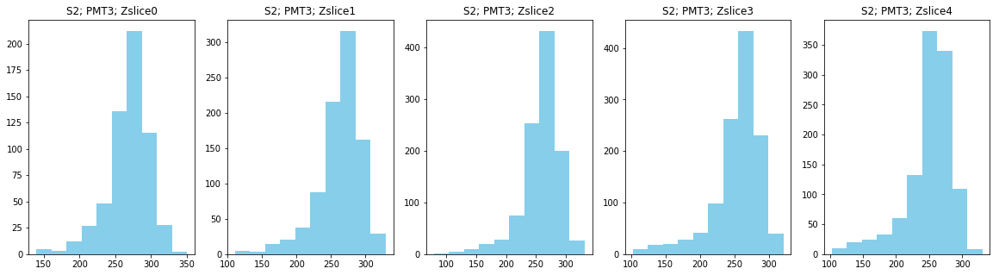

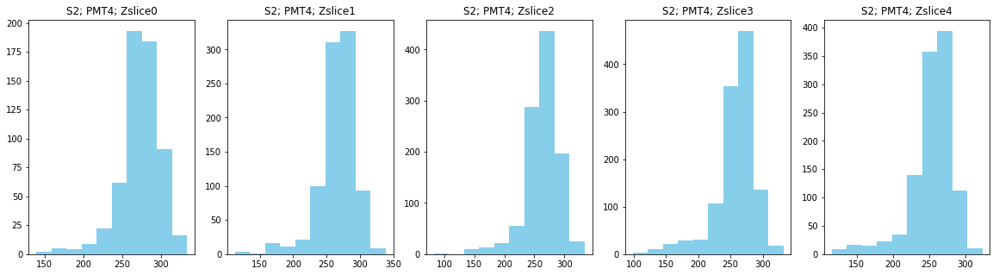

...

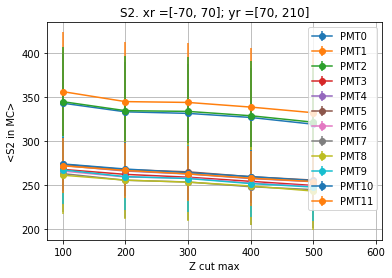

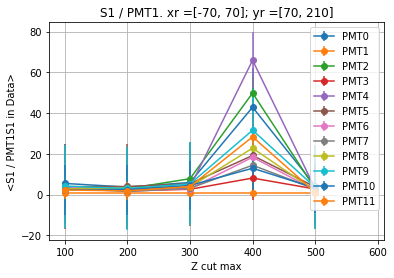

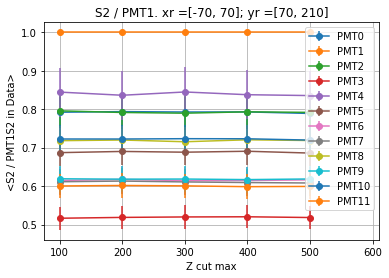

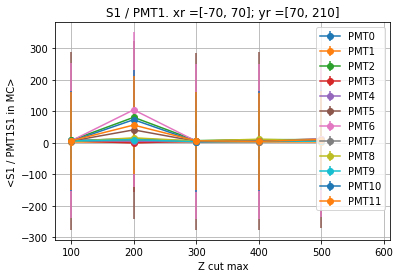

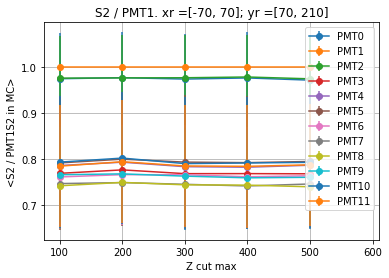

Dividing S2s
Dividing S1s


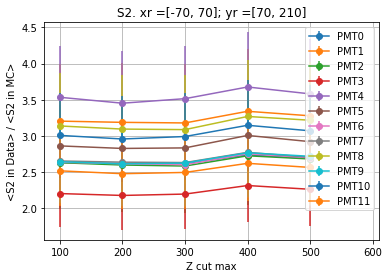

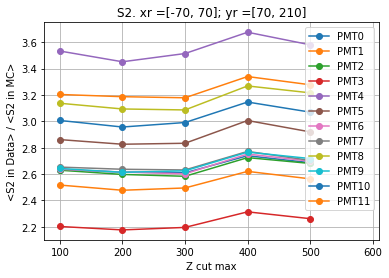

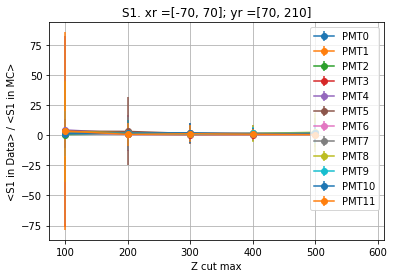

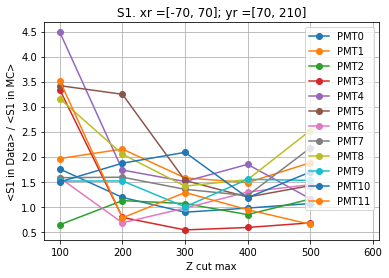

xr = [70, 210] ; yr = [-210, -70]
calculating data...


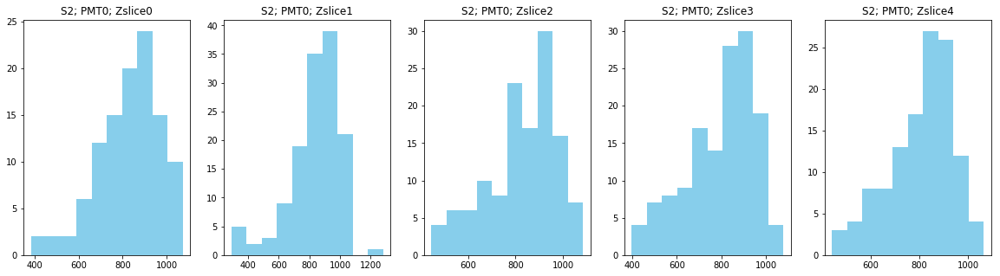

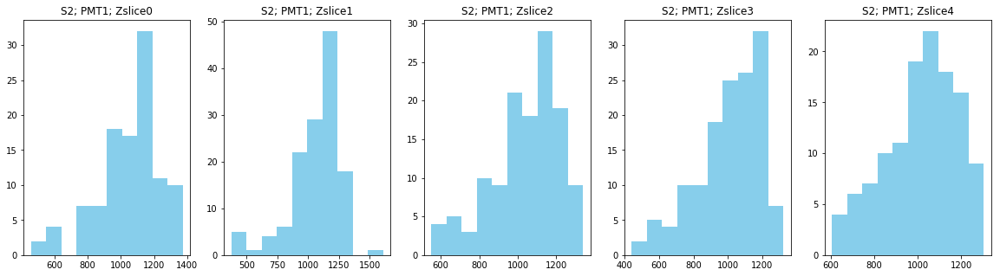

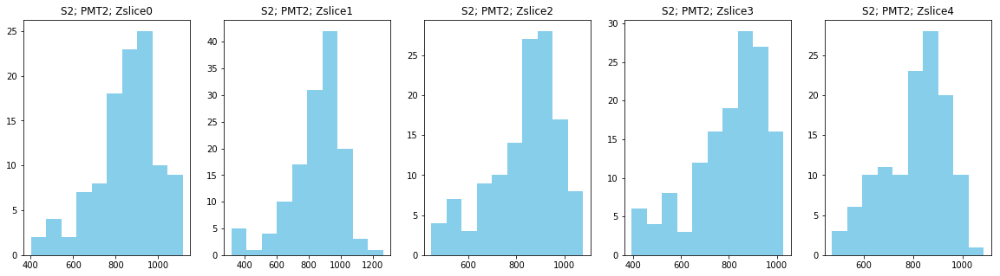

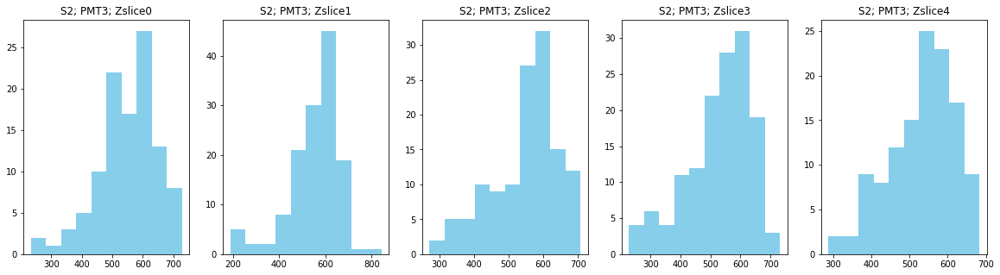

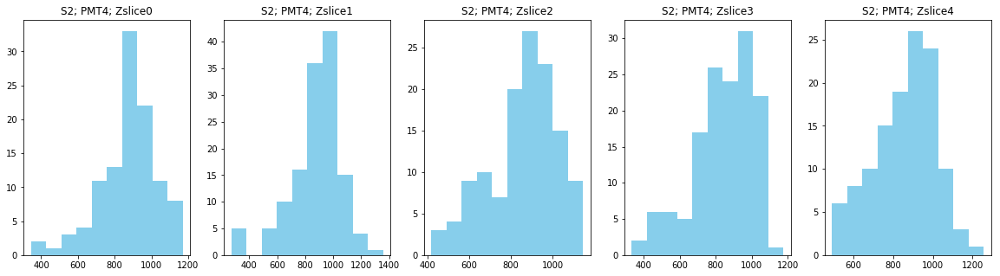

...

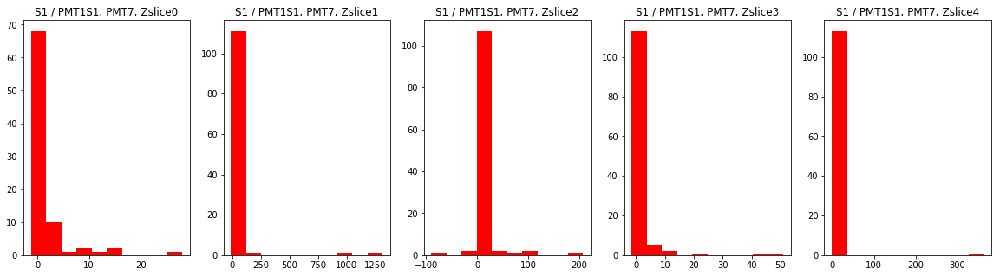

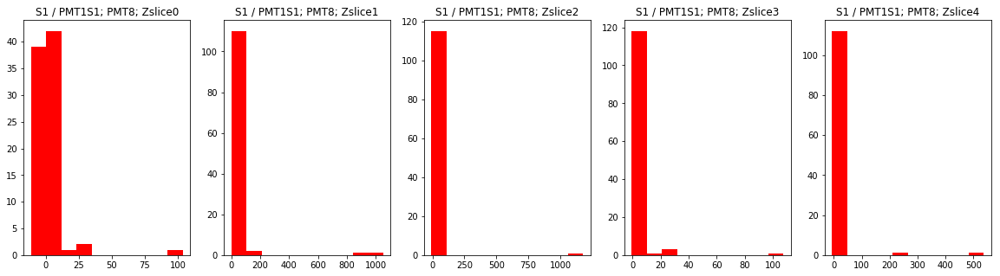

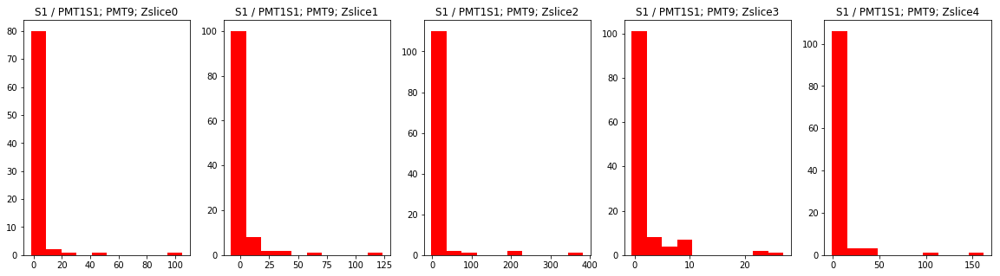

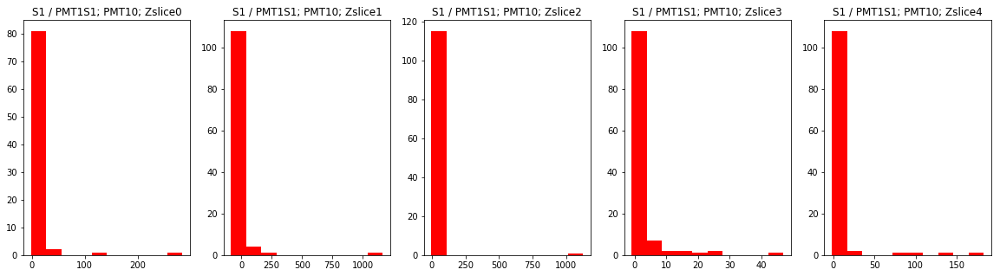

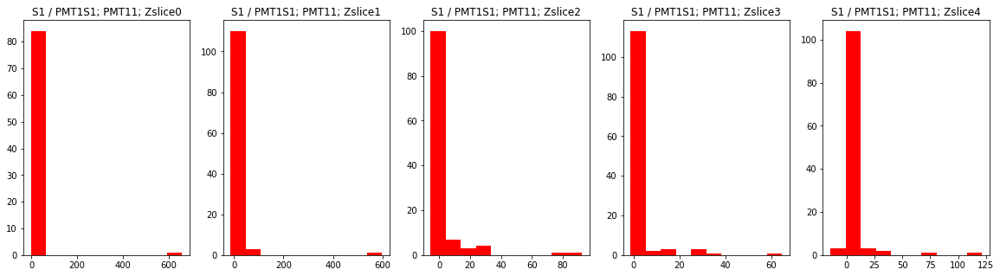

Calculated S2 matrix =
[[0.79164267, 0.78916657, 0.7949548, 0.7941618, 0.795672], [1.0, 1.0, 1.0, 1.0, 1.0], [0.807956, 0.7997078, 0.79907143, 0.79777, 0.7965035], [0.5286701, 0.52480555, 0.526996, 0.5222285, 0.52635413], [0.8300415, 0.82839394, 0.8225095, 0.8403301, 0.8445616], [0.6865677, 0.6861283, 0.6878042, 0.6864962, 0.69190395], [0.62624997, 0.6178762, 0.6208475, 0.61979985, 0.61835337], [0.61530346, 0.6227783, 0.6237668, 0.6179794, 0.6215135], [0.7327651, 0.7290838, 0.7257977, 0.7307835, 0.72895783], [0.63619906, 0.6284035, 0.6325289, 0.6370572, 0.6359072], [0.73654366, 0.72872573, 0.73178977, 0.73152965, 0.7326378], [0.60364723, 0.60384285, 0.60099036, 0.5999891, 0.6023697]]
calculating mc...


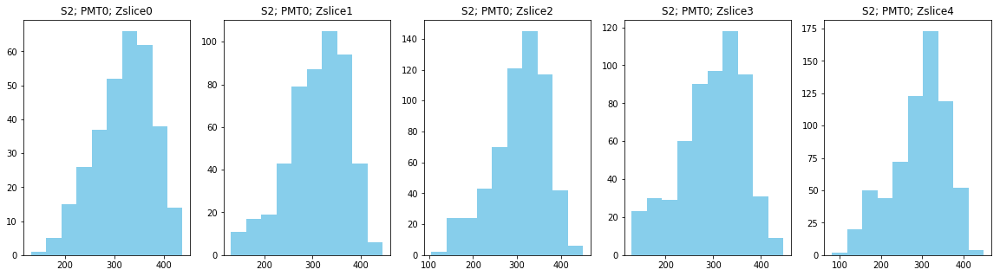

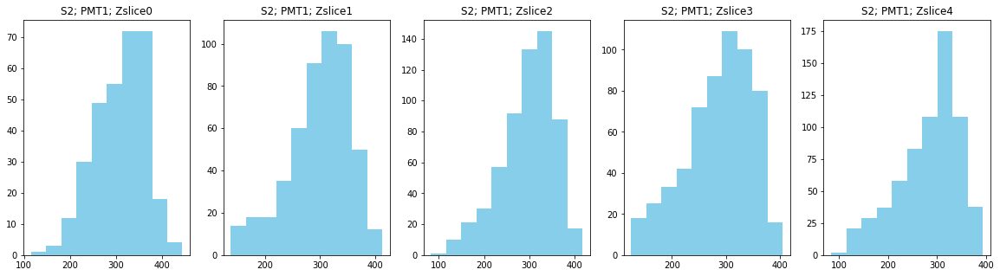

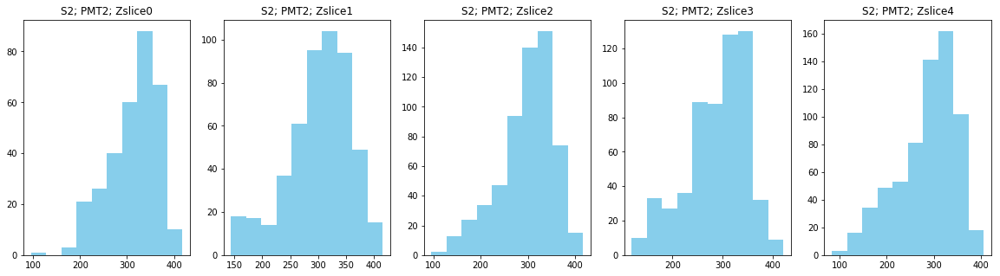

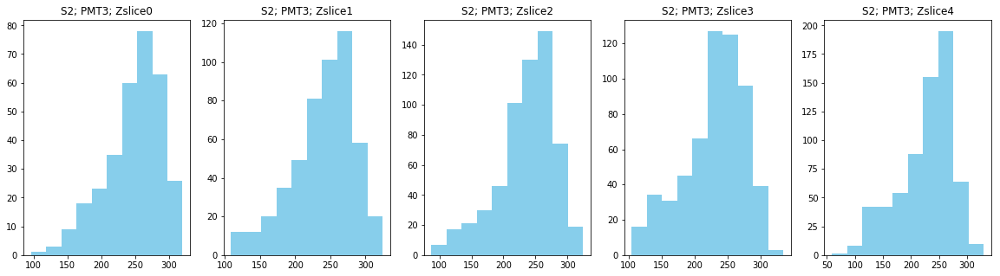

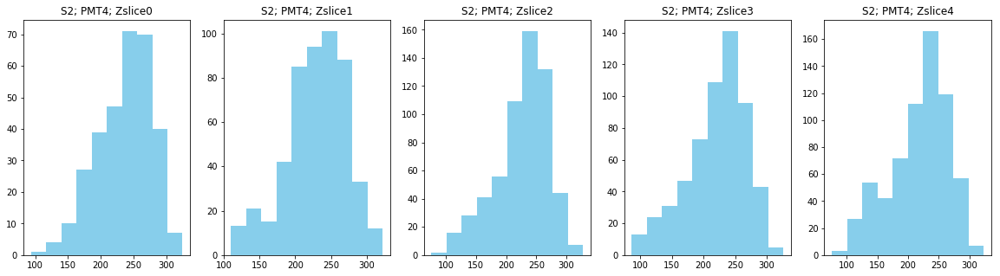

...

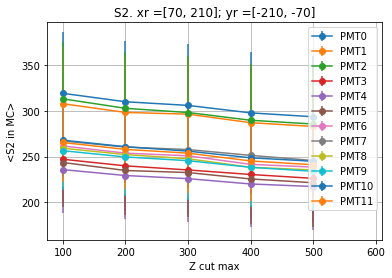

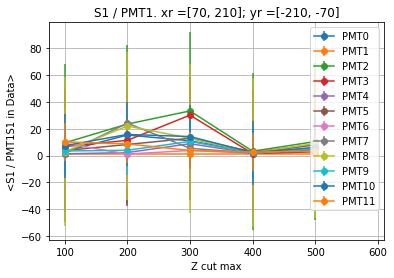

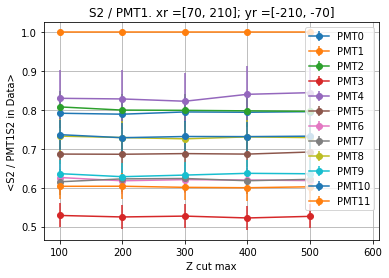

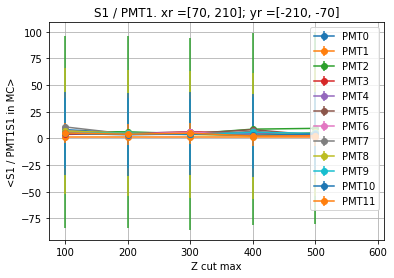

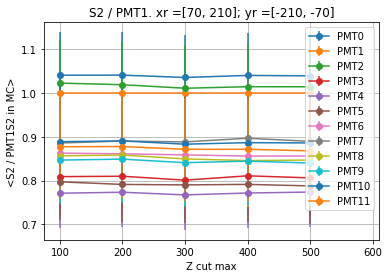

Dividing S2s
Dividing S1s


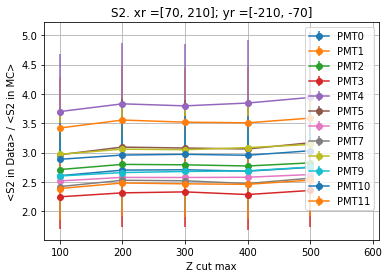

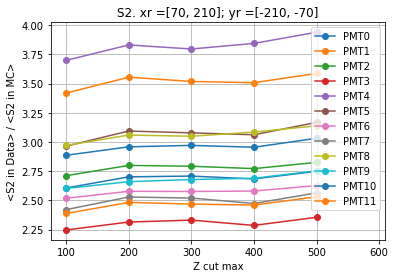

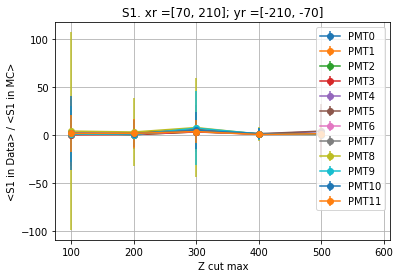

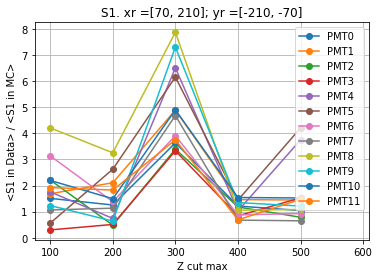

xr = [70, 210] ; yr = [-70, 70]
calculating data...


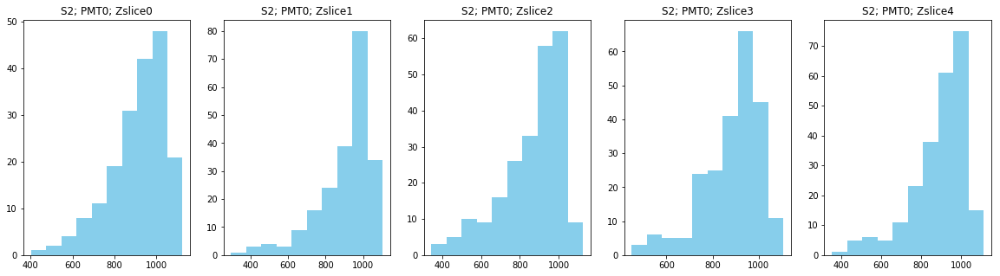

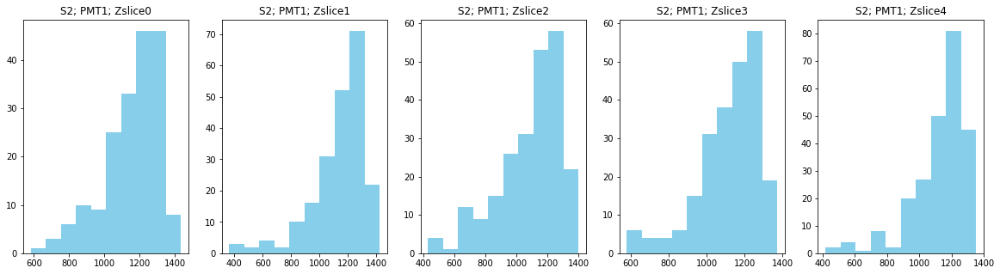

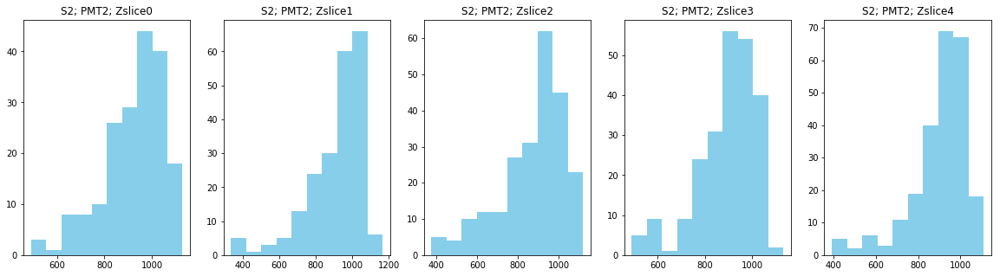

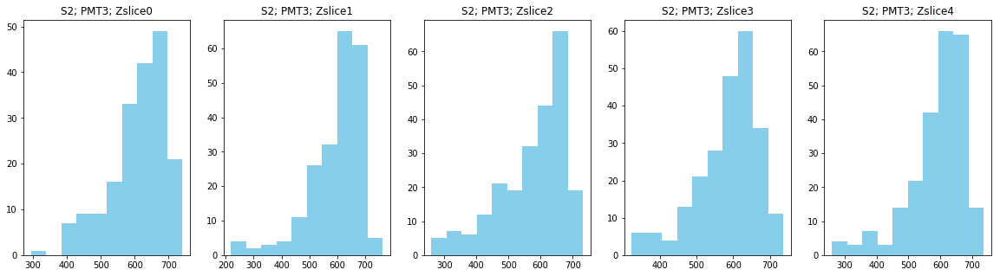

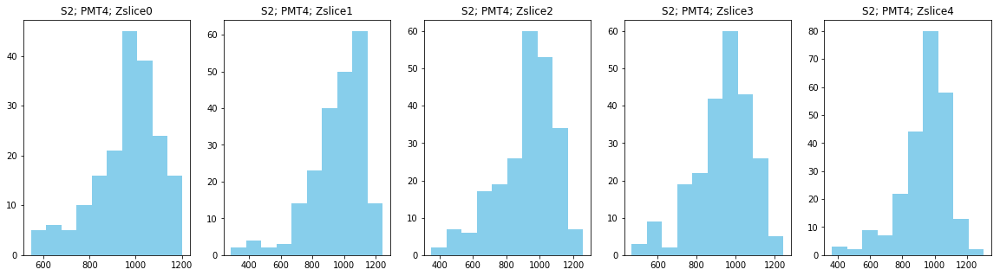

...

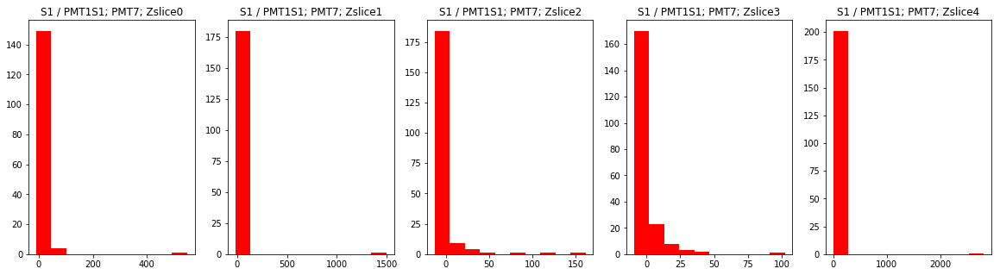

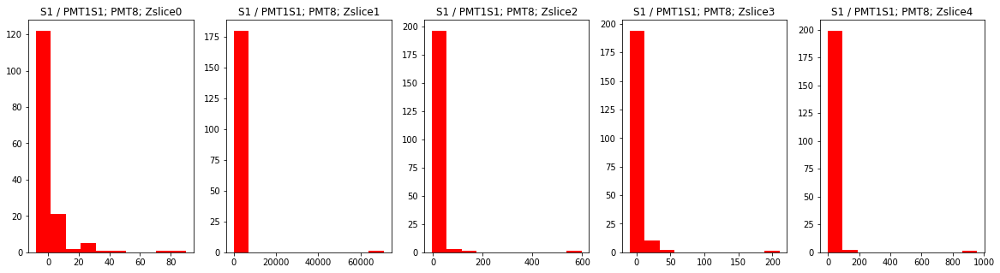

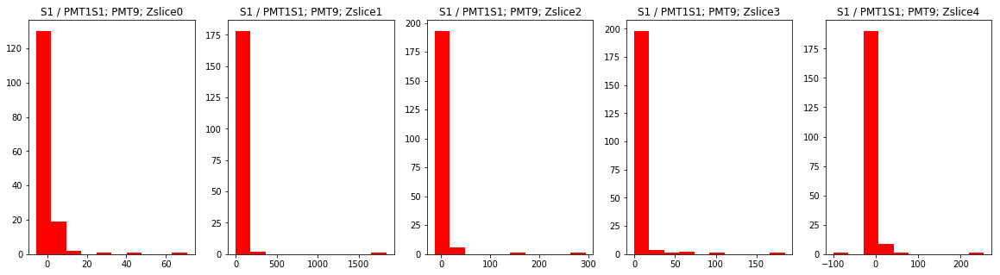

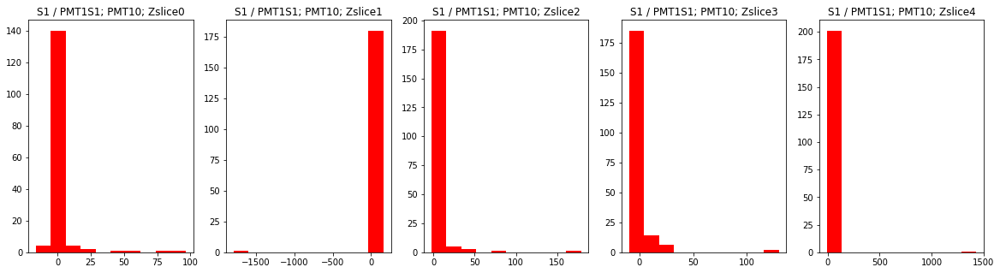

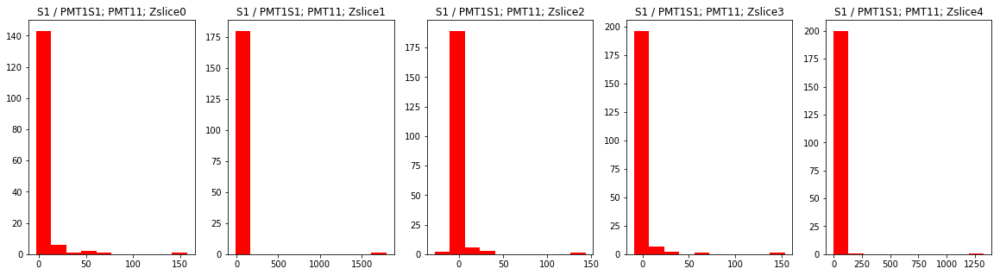

Calculated S2 matrix =
[[0.787386, 0.7947248, 0.79419184, 0.795119, 0.7921165], [1.0, 1.0, 1.0, 1.0, 1.0], [0.79881114, 0.8024948, 0.8015061, 0.8014647, 0.80182457], [0.5279379, 0.52429634, 0.52932674, 0.5261831, 0.52512807], [0.8332039, 0.840764, 0.84592205, 0.83877635, 0.83792293], [0.68659735, 0.6886002, 0.6907587, 0.6903314, 0.68928283], [0.61485255, 0.61740243, 0.6162977, 0.6176379, 0.61895066], [0.6170185, 0.6134079, 0.61868644, 0.6173364, 0.6171912], [0.7290576, 0.7262624, 0.73080575, 0.72952944, 0.7324315], [0.63032216, 0.6305671, 0.632105, 0.6334045, 0.6274842], [0.72819984, 0.730279, 0.73110604, 0.7292903, 0.7280208], [0.6028151, 0.6005659, 0.60524535, 0.60338575, 0.60386574]]
calculating mc...


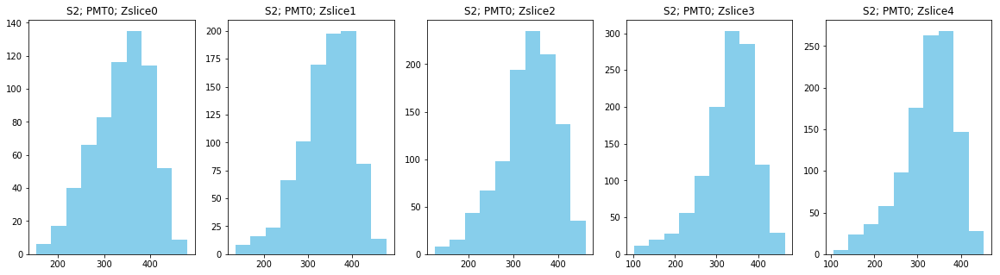

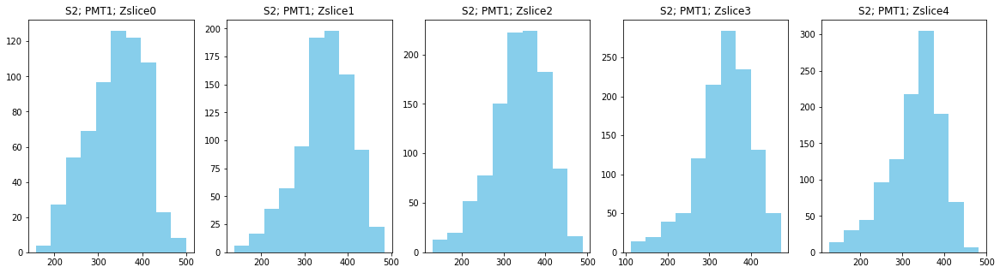

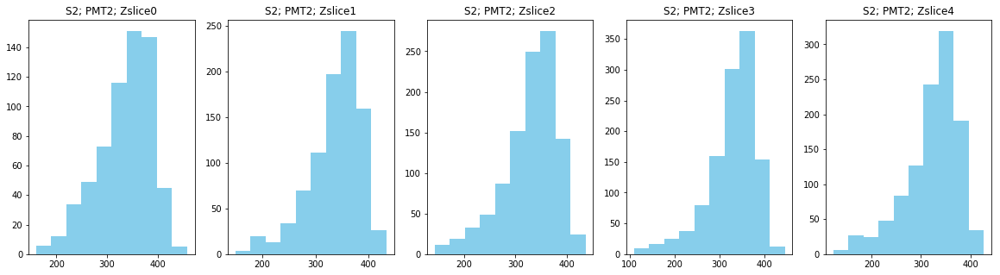

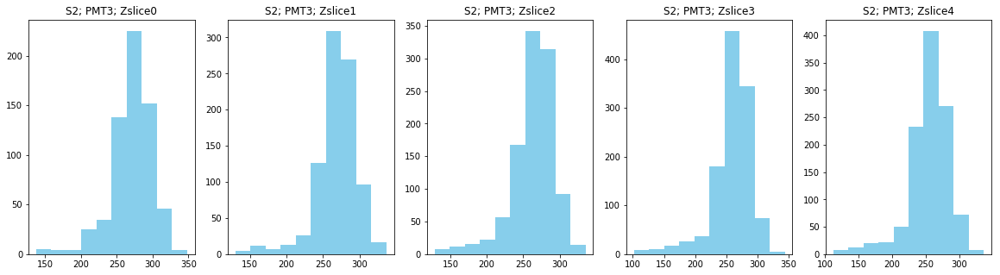

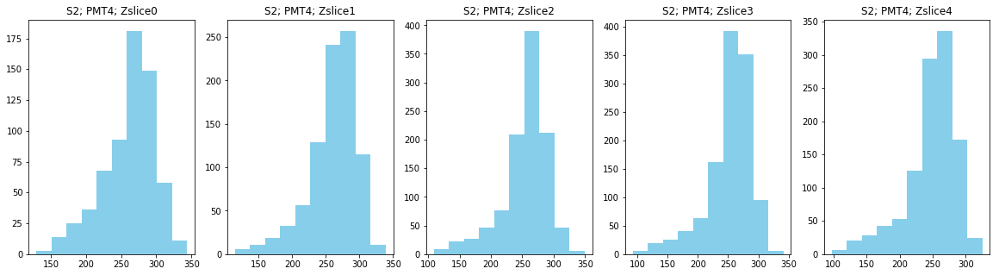

...

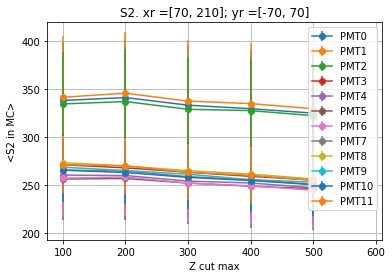

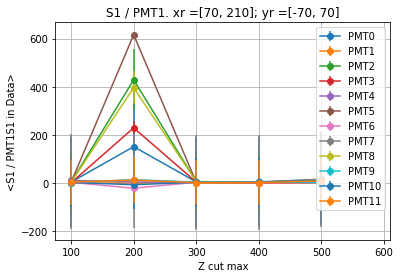

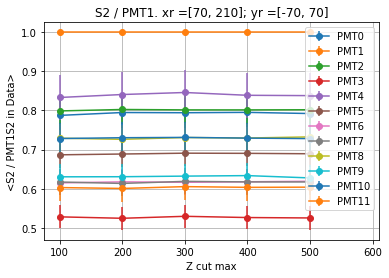

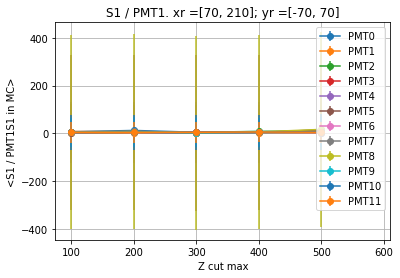

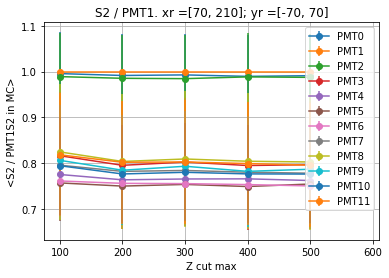

Dividing S2s
Dividing S1s


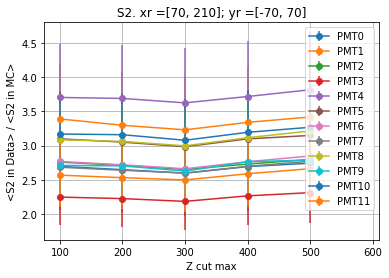

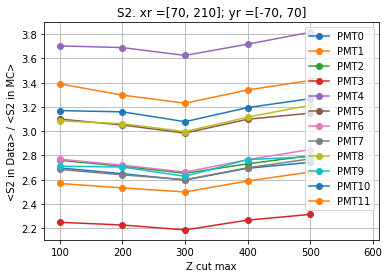

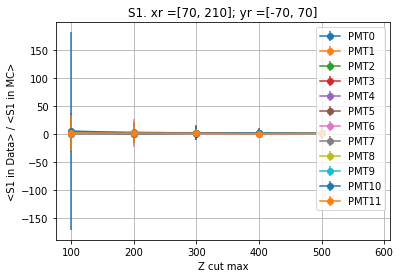

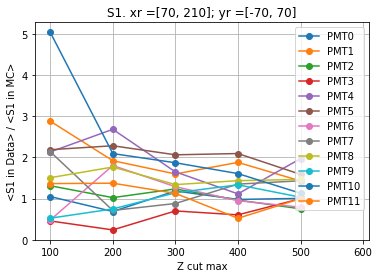

xr = [70, 210] ; yr = [70, 210]
calculating data...


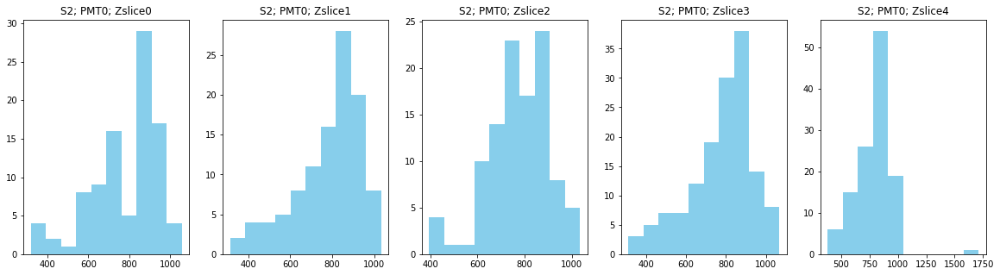

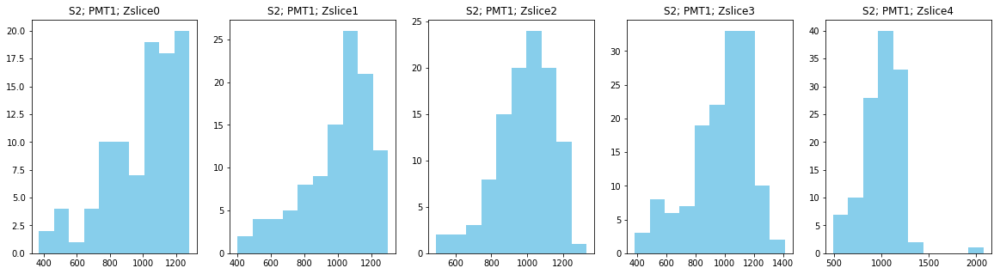

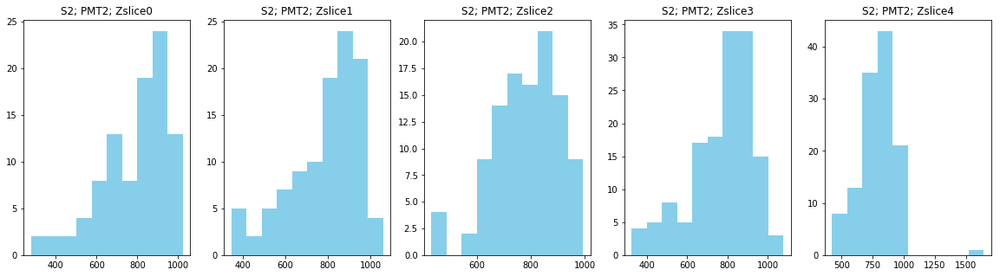

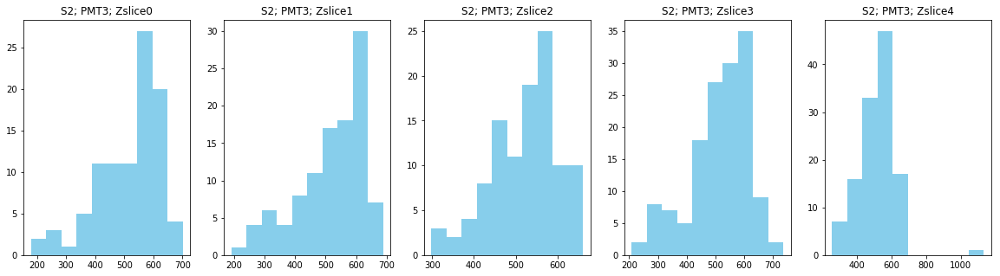

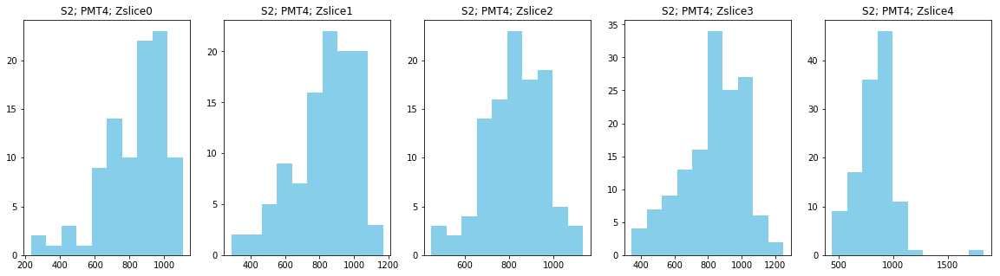

...

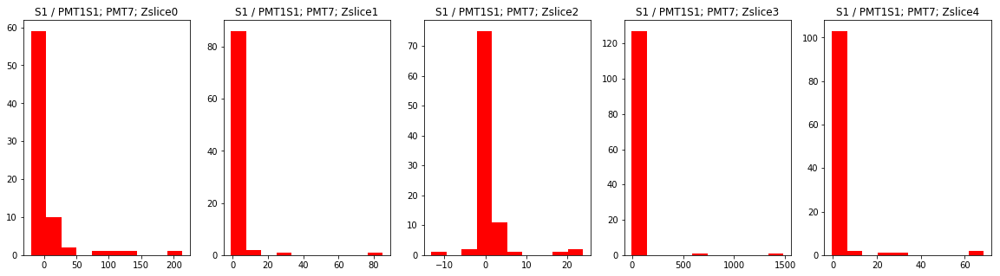

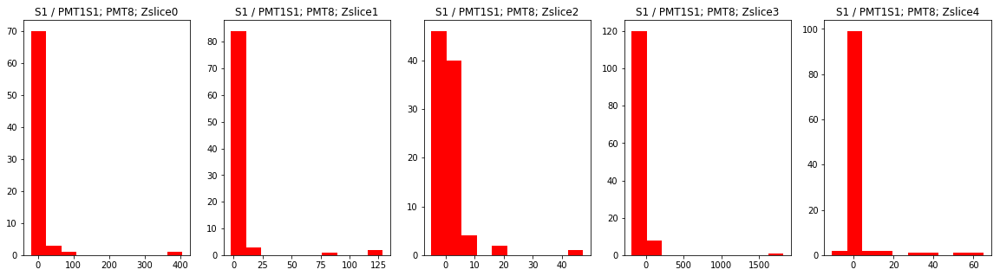

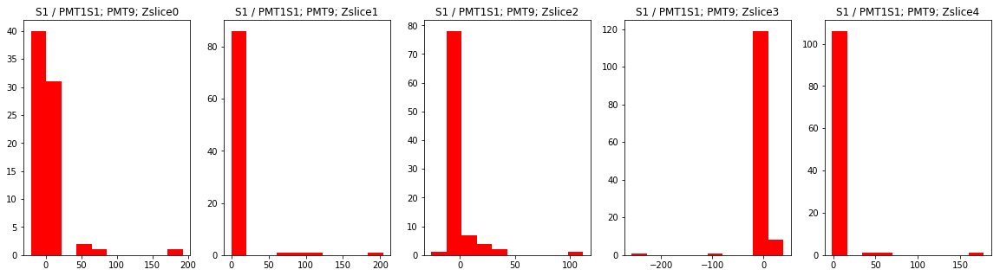

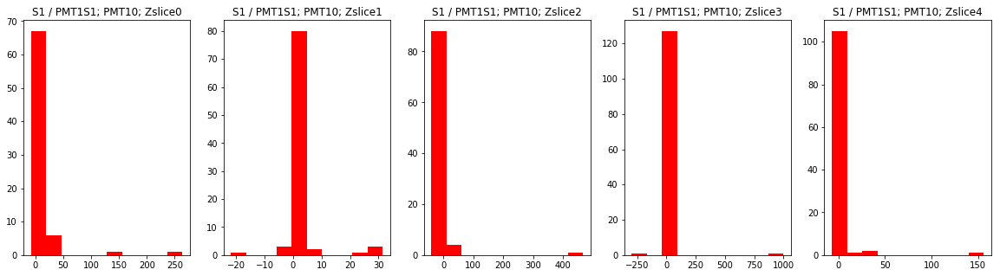

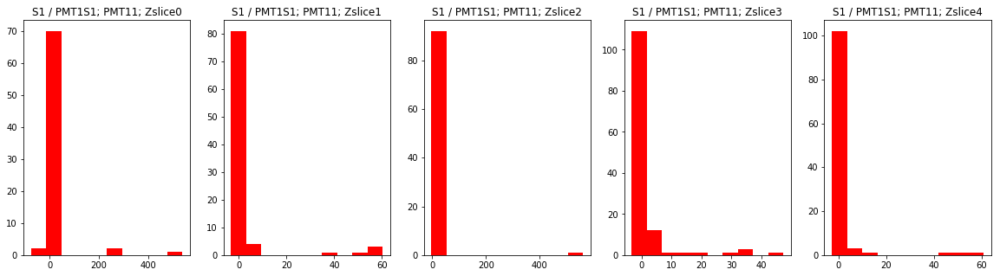

Calculated S2 matrix =
[[0.785624, 0.78822875, 0.78469896, 0.796303, 0.7891525], [1.0, 1.0, 1.0, 1.0, 1.0], [0.79443157, 0.7928817, 0.7923589, 0.79243255, 0.78811455], [0.521965, 0.520435, 0.5292392, 0.5258635, 0.51720905], [0.83561176, 0.83791816, 0.8397801, 0.85277146, 0.835973], [0.6825051, 0.68776625, 0.6857663, 0.6888736, 0.68202114], [0.60723305, 0.60681856, 0.61403084, 0.61409104, 0.60466236], [0.6009427, 0.60845363, 0.61089754, 0.61250126, 0.6071526], [0.7206104, 0.7192845, 0.72533995, 0.7248561, 0.7198043], [0.6230177, 0.62190104, 0.62734795, 0.6308459, 0.62312996], [0.7264941, 0.72991157, 0.7298787, 0.7301201, 0.7246021], [0.594698, 0.59519815, 0.60008425, 0.59968555, 0.59764117]]
calculating mc...


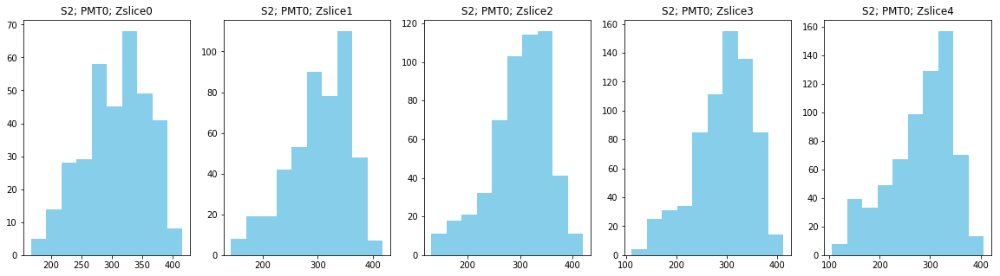

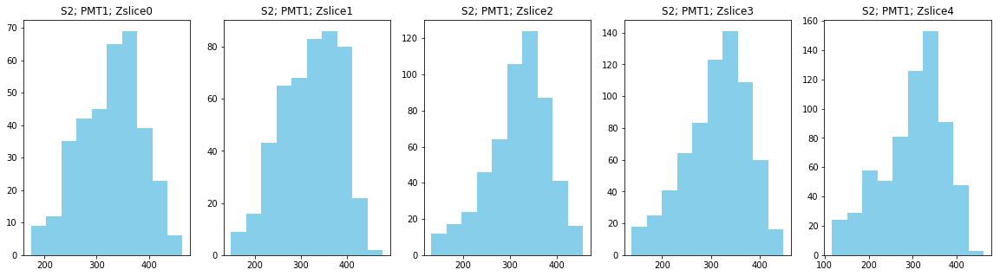

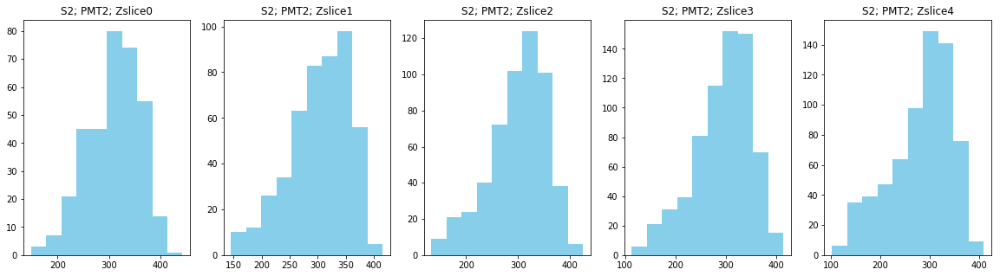

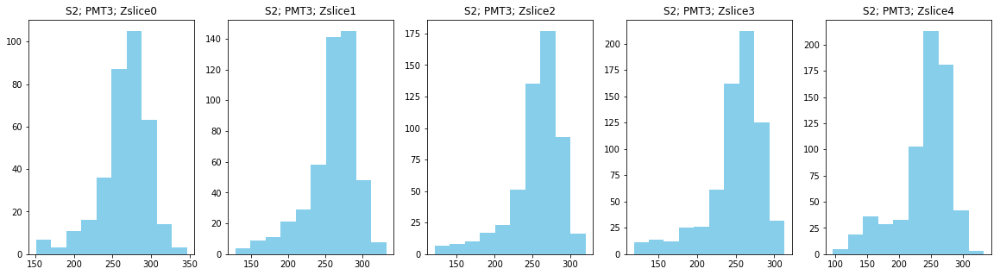

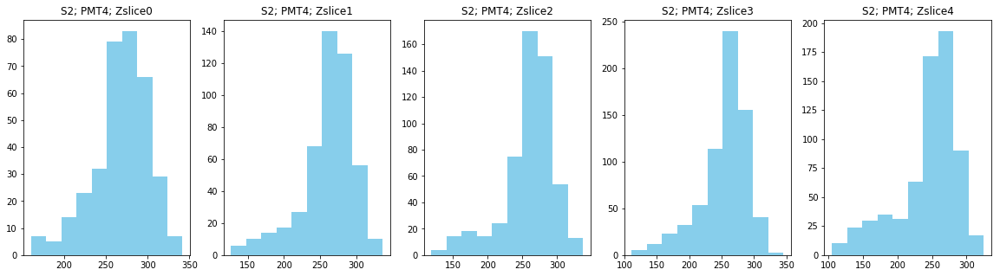

...

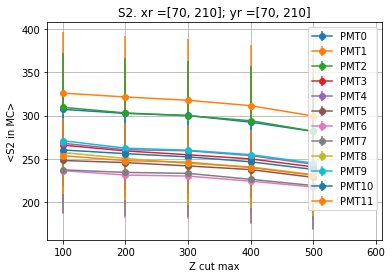

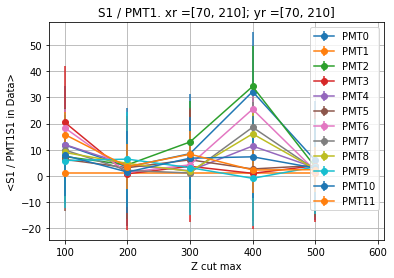

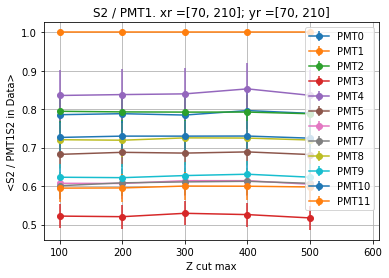

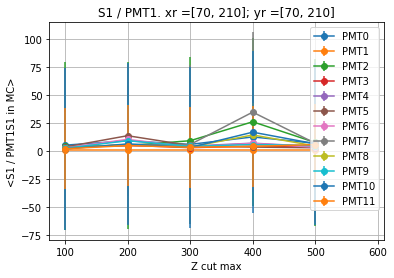

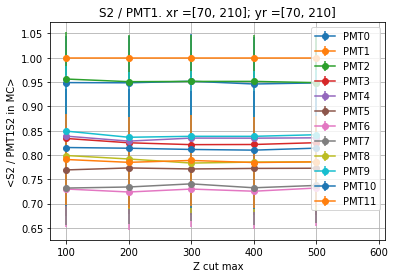

Dividing S2s
Dividing S1s


/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in true_divide
  after removing the cwd from sys.path.
/Users/jmhaefner/miniconda/envs/IC-3.7-2018-11-14/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in multiply
  after removing the cwd from sys.path.


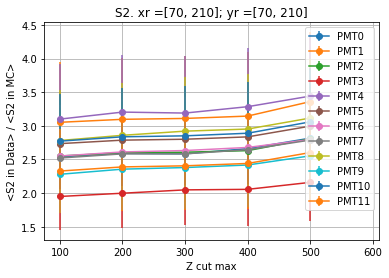

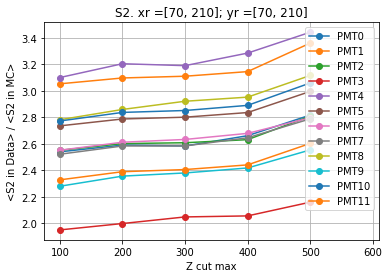

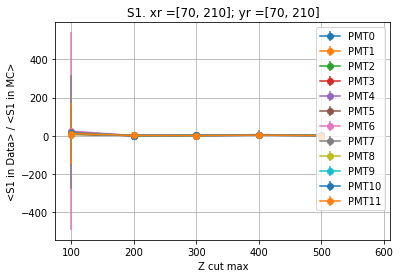

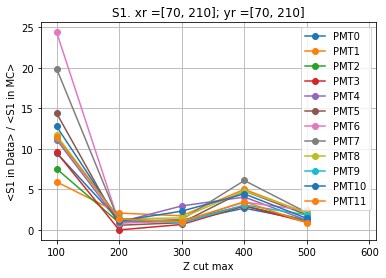

In [28]:
#xedges = [-210, -70]
xedges = [-210, -70, 70, 210]
xranges = [[xedges[i], xedges[i+1]] for i in range(len(xedges)-1)]

#yedges = [-70, 70]
yedges = [-210, -70, 70, 210]
yranges = [[yedges[i], yedges[i+1]] for i in range(len(yedges)-1)]

zcuts = [2, 100, 200, 300, 400, 500]
zranges = [[zcuts[i], zcuts[i+1]] for i in range(len(zcuts)-1)]

for xr, yr in itertools.product(xranges, yranges):
    print('xr =', xr, '; yr =', yr)

    print('calculating data...')
    data_s1avgs_ZPMT, data_s2avgs_ZPMT, data_s1vars, data_s2vars, data_s1avgs_ZPMT_vPMT1, data_s2avgs_ZPMT_vPMT1, data_s1vars_vPMT1, data_s2vars_vPMT1 = mean_signal_vsPMTZ(good_data_pmaps, xr, yr, zranges)
    print('Calculated S2 matrix =')
    print(data_s2avgs_ZPMT_vPMT1)
    print('calculating mc...')
    mc_s1avgs_ZPMT, mc_s2avgs_ZPMT, mc_s1vars, mc_s2vars, mc_s1avgs_ZPMT_vPMT1, mc_s2avgs_ZPMT_vPMT1, mc_s1vars_vPMT1, mc_s2vars_vPMT1 = mean_signal_vsPMTZ(good_mc_pmaps, xr, yr, zranges)

    ###########################################
    ### PLOTS BEFORE DIVISION, UNNORMALIZED ###
    ###########################################

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s1avgs_ZPMT[pid], yerr = np.array(data_s1vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 in Data>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s2avgs_ZPMT[pid], yerr = np.array(data_s2vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 in Data>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s1avgs_ZPMT[pid], yerr = np.array(mc_s1vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s2avgs_ZPMT[pid], yerr = np.array(mc_s2vars[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    ##############################################
    ### PLOTS BEFORE DIVISION, PMT1 NORMALIZED ###
    ##############################################

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s1avgs_ZPMT_vPMT1[pid], yerr = np.array(data_s1vars_vPMT1[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 / PMT1S1 in Data>')
    plt.xlim(75, 610)
    plt.title('S1 / PMT1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], data_s2avgs_ZPMT_vPMT1[pid], yerr = np.array(data_s2vars_vPMT1[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 / PMT1S2 in Data>')
    plt.xlim(75, 610)
    plt.title('S2 / PMT1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s1avgs_ZPMT_vPMT1[pid], yerr = np.array(mc_s1vars_vPMT1[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 / PMT1S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1 / PMT1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], mc_s2avgs_ZPMT_vPMT1[pid], yerr = np.array(mc_s2vars_vPMT1[pid])**0.5, fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 / PMT1S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2 / PMT1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    # print('Data ZPMTs =', data_s2avgs_ZPMT)
    # print('MC ZPMTS   =', mc_s2avgs_ZPMT)
    
    ### DIVIDED PLOTS ###
    
    print('Dividing S2s')
    pmt_ratios_s2 = data_s2avgs_ZPMT / mc_s2avgs_ZPMT
    pmt_ratios_s2[pmt_ratios_s2 == np.inf] = 0

    print('Dividing S1s')                
    pmt_ratios_s1 = data_s1avgs_ZPMT / mc_s1avgs_ZPMT
    pmt_ratios_s1[pmt_ratios_s1 == np.inf] = 0
    
    pmt_ratios_s1_err = varfrac(data_s1avgs_ZPMT, mc_s1avgs_ZPMT, data_s1vars, mc_s1vars)**0.5
    pmt_ratios_s2_err = varfrac(data_s2avgs_ZPMT, mc_s2avgs_ZPMT, data_s2vars, mc_s2vars)**0.5
    
    ## PLOT WITH ERROR BARS ###
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], yerr = pmt_ratios_s2_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s2[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S2 in Data> / <S2 in MC>')
    plt.xlim(75, 610)
    plt.title('S2. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()

    ### PLOT WITHOUT ERROR BARS ###
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], yerr = pmt_ratios_s1_err[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()
    
    for pid in pmt_ids:
        plt.errorbar(zcuts[1:], pmt_ratios_s1[pid], fmt = 'o-', label = 'PMT'+str(pid))
    plt.grid()
    plt.xlabel('Z cut max')
    plt.ylabel('<S1 in Data> / <S1 in MC>')
    plt.xlim(75, 610)
    plt.title('S1. xr ='+str(xr)+'; yr ='+str(yr))
    plt.legend(loc = 'upper right')
    plt.show()